#### test_outputs.ipynb to post-process the groundwater outputs from the test cases

In [9]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.colors as colors
import os
import fiona

import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.transform import xy
import contextily as ctx
from rasterio.plot import plotting_extent
from rasterio.features import shapes
from shapely.geometry import shape

from regional_K.cpt_functions import get_tiff_values_flood, get_tiff_value

In [10]:
# load in the data and metadata

budget_summary = pd.read_csv('./alameda_budget_summary.csv')
inputs = pd.read_csv('./input_params.csv', index_col=0)

folder = './wtdepths_250307/'
target_crs = "EPSG:4326"

#### Plot wtd

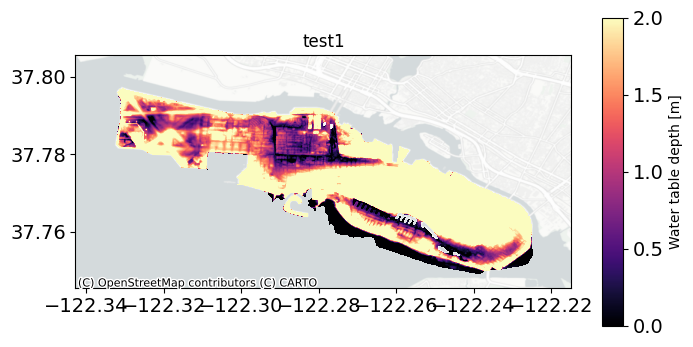

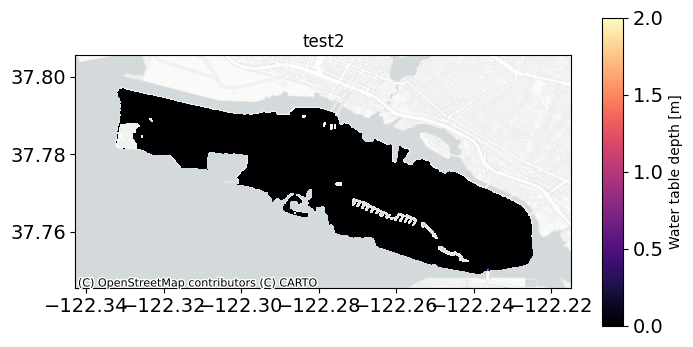

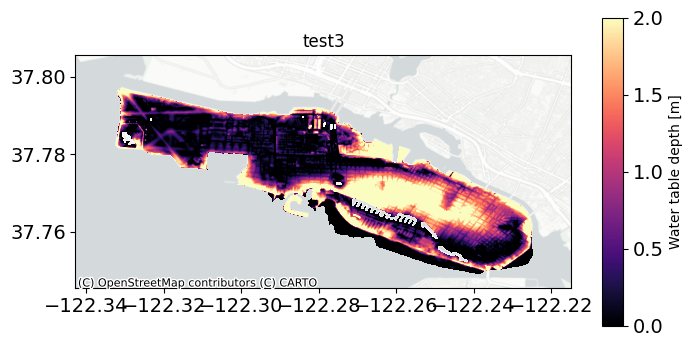

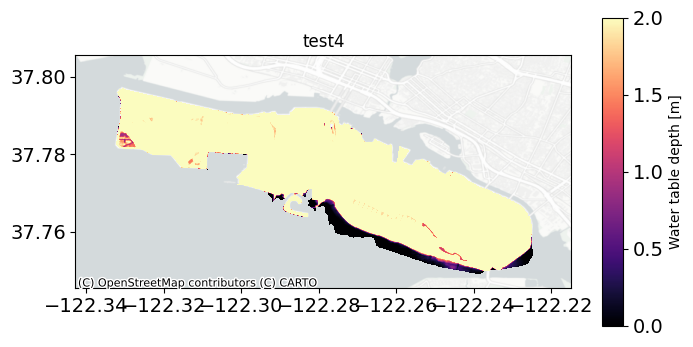

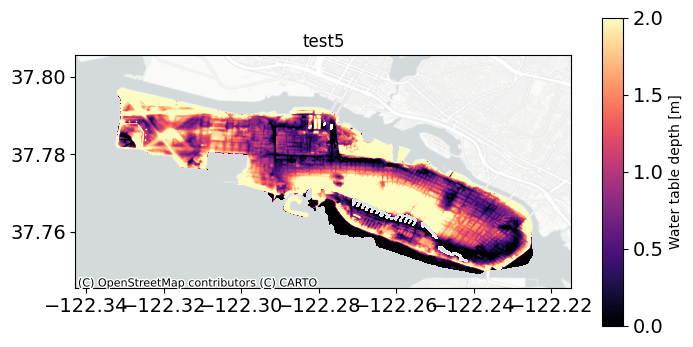

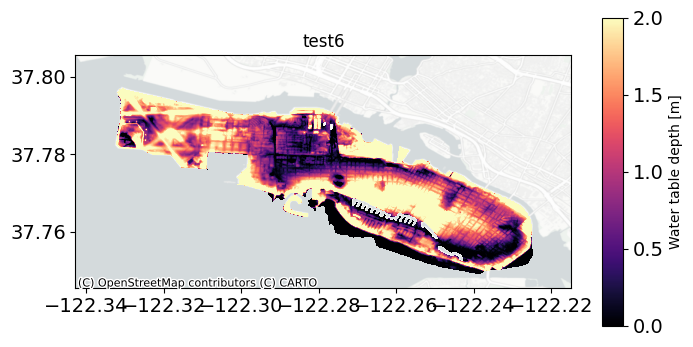

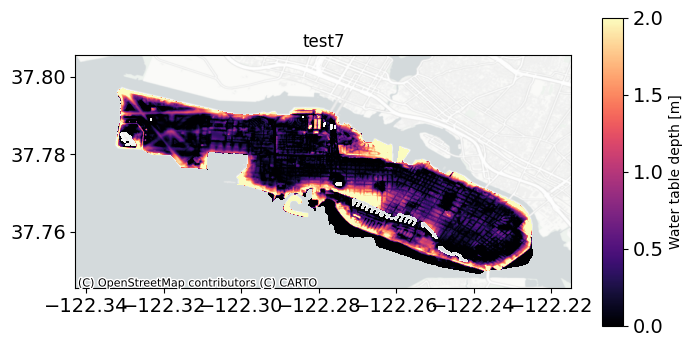

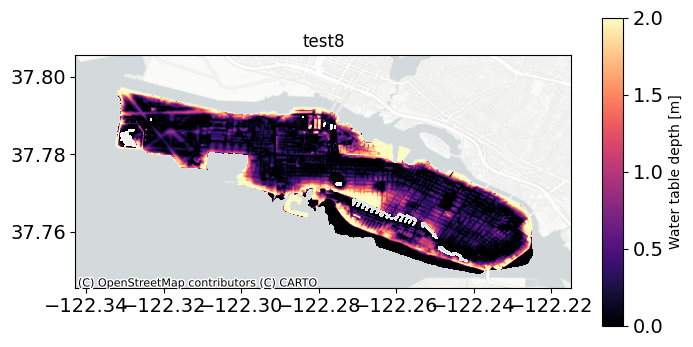

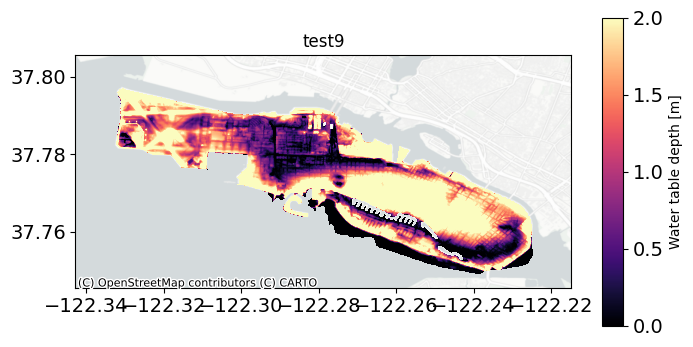

In [11]:
target_crs = "EPSG:4326"
for test in inputs['names']:
    file = folder + 'alameda_0_MTL_slr0.00m_Kh' + test + '_10m_wtdepth_nofel.tif'
    with rasterio.open(file) as src:
        transform, width, height = calculate_default_transform(
            src.crs,         # source CRS
            target_crs,      # target CRS
            src.width,
            src.height,
            *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height})
        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=reprojected_data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    band1 = reprojected_data[0]
    band1_masked = np.where(band1 < -1, np.nan, band1)  # mask out the no data values
    top_left = xy(transform, 0, 0, offset="ul")
    bottom_right = xy(transform, height-1, width-1, offset="lr")
    left, top = top_left
    right, bottom = bottom_right

    fig, ax = plt.subplots(figsize=(8, 8))
    img = ax.imshow(
        band1_masked, 
        extent=(left, right, bottom, top), 
        origin="upper", 
        cmap="magma",
        vmin=0,
        vmax=2
    )
    fig.colorbar(img, label="Water table depth [m]",shrink=0.5,aspect=15)
    ctx.add_basemap(
        ax,
        crs=target_crs,  # "EPSG:4326"
        source=ctx.providers.CartoDB.PositronNoLabels,
        zorder=-1
    )
    plt.title(test)
    plt.show()

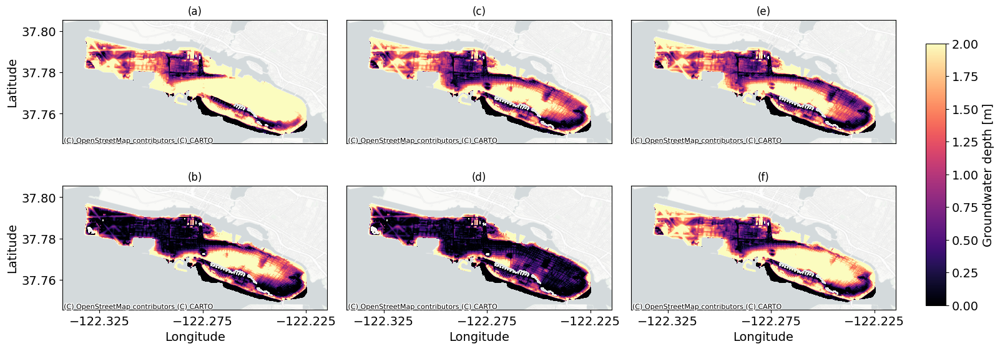

In [12]:
## plot the above just for 
tests = ["test1", "test6", "test5", "test3", "test7", "test9"]
label = ['(a)', '(c)', '(e)', '(b)', '(d)', '(f)']
# make all tick labels font 14
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14

fig, axs = plt.subplots(2, 3, figsize=(16, 6))
axes = axs.flatten()
for ind, test in enumerate(tests):
    file = folder + 'alameda_0_MTL_slr0.00m_Kh' + test + '_10m_wtdepth_nofel.tif'
    with rasterio.open(file) as src:
        transform, width, height = calculate_default_transform(
            src.crs,         # source CRS
            target_crs,      # target CRS
            src.width,
            src.height,
            *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height})
        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=reprojected_data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    band1 = reprojected_data[0]
    band1_masked = np.where(band1 < -1, np.nan, band1)  # mask out the no data values
    top_left = xy(transform, 0, 0, offset="ul")
    bottom_right = xy(transform, height-1, width-1, offset="lr")
    left, top = top_left
    right, bottom = bottom_right

    img = axes[ind].imshow(band1_masked, extent=(left, right, bottom, top), origin="upper", cmap="magma", vmin=0,vmax=2)
    axes[ind].set_title(label[ind])
    if ind in [0, 3]:
        axes[ind].set_ylabel("Latitude", fontsize=14)
    else:
        axes[ind].set_yticks([])
    if ind in [3, 4, 5]:
        axes[ind].set_xlabel('Longitude', fontsize=14)
        axes[ind].set_xticks(axes[ind].get_xticks()[1::2])
    else:
        axes[ind].set_xticks([])

    ctx.add_basemap(axes[ind],crs=target_crs, source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)
plt.tight_layout()

plt.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, label="Groundwater depth [m]")
cbar_ax.tick_params(labelsize=14)
cbar_ax.yaxis.label.set_size(14)

# plt.savefig('./figures/test_gw_depths.png', dpi=1000, format = 'png', bbox_inches='tight')
# plt.savefig('./figures/test_gw_depths.pdf', dpi=1000, format = 'pdf', bbox_inches='tight')

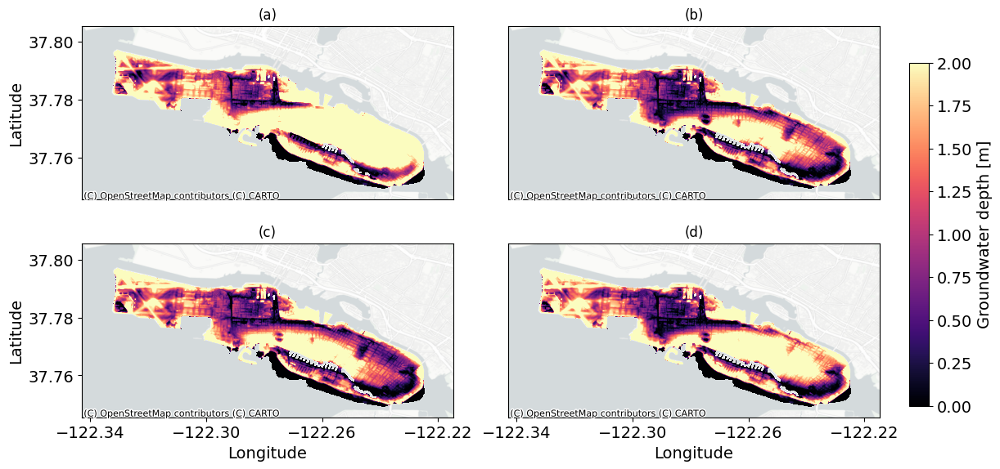

In [13]:
## plot the above just for 
tests = ["test1", "test6", "test5", "test9"]
label = ['(a)', '(b)', '(c)', '(d)']
# make all tick labels font 14
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14

fig, axs = plt.subplots(2, 2, figsize=(12, 6))
axes = axs.flatten()
for ind, test in enumerate(tests):
    file = folder + 'alameda_0_MTL_slr0.00m_Kh' + test + '_10m_wtdepth_nofel.tif'
    with rasterio.open(file) as src:
        transform, width, height = calculate_default_transform(
            src.crs,         # source CRS
            target_crs,      # target CRS
            src.width,
            src.height,
            *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height})
        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=reprojected_data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    band1 = reprojected_data[0]
    band1_masked = np.where(band1 < -1, np.nan, band1)  # mask out the no data values
    top_left = xy(transform, 0, 0, offset="ul")
    bottom_right = xy(transform, height-1, width-1, offset="lr")
    left, top = top_left
    right, bottom = bottom_right

    img = axes[ind].imshow(band1_masked, extent=(left, right, bottom, top), origin="upper", cmap="magma", vmin=0,vmax=2)
    axes[ind].set_title(label[ind])
    if ind in [0, 2]:
        axes[ind].set_ylabel("Latitude", fontsize=14)
    else:
        axes[ind].set_yticks([])
    if ind in [2, 3]:
        axes[ind].set_xlabel('Longitude', fontsize=14)
        axes[ind].set_xticks(axes[ind].get_xticks()[1::2])
    else:
        axes[ind].set_xticks([])

    ctx.add_basemap(axes[ind],crs=target_crs, source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)
plt.tight_layout()

plt.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, label="Groundwater depth [m]")
cbar_ax.tick_params(labelsize=14)
cbar_ax.yaxis.label.set_size(14)

plt.savefig('./figures/test_gw_depths_MTL.png', dpi=1000, format = 'png', bbox_inches='tight')
plt.savefig('./figures/test_gw_depths_MTL.pdf', dpi=1000, format = 'pdf', bbox_inches='tight')

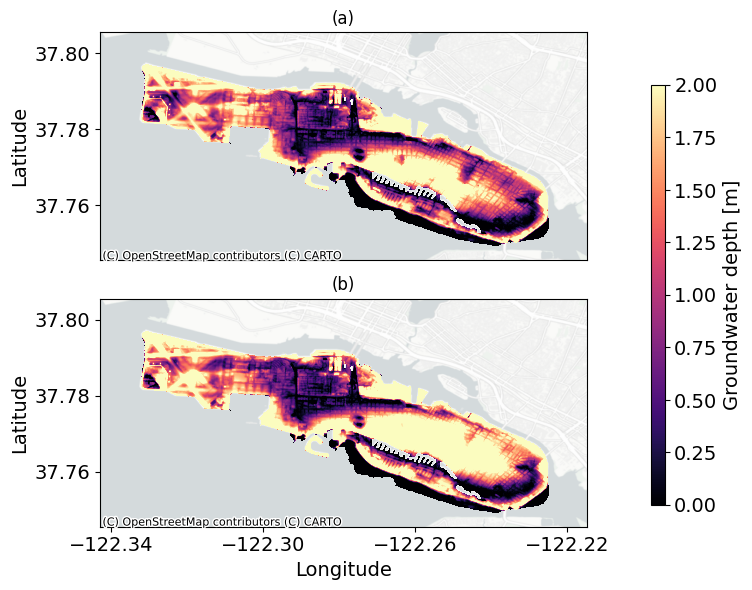

In [14]:
# plot the above just for tests 6 and 9
tests = ["test6", "test9"]
label = ['(a)', '(b)']
fig, axs = plt.subplots(2, 1, figsize=(7, 6))
axes = axs.flatten()
for ind, test in enumerate(tests):
    file = folder + 'alameda_0_MTL_slr0.00m_Kh' + test + '_10m_wtdepth_nofel.tif'
    with rasterio.open(file) as src:
        transform, width, height = calculate_default_transform(
            src.crs,         # source CRS
            target_crs,      # target CRS
            src.width,
            src.height,
            *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height})
        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=reprojected_data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    band1 = reprojected_data[0]
    band1_masked = np.where(band1 < -1, np.nan, band1)  # mask out the no data values
    top_left = xy(transform, 0, 0, offset="ul")
    bottom_right = xy(transform, height-1, width-1, offset="lr")
    left, top = top_left
    right, bottom = bottom_right

    img = axes[ind].imshow(band1_masked, extent=(left, right, bottom, top), origin="upper", cmap="magma", vmin=0,vmax=2)
    axes[ind].set_title(label[ind])
    if ind in [0, 1]:
        axes[ind].set_ylabel("Latitude", fontsize=14)
    else:
        axes[ind].set_yticks([])
    if ind in [1]:
        axes[ind].set_xlabel('Longitude', fontsize=14)
        axes[ind].set_xticks(axes[ind].get_xticks()[1::2])
    else:
        axes[ind].set_xticks([])

    ctx.add_basemap(axes[ind],crs=target_crs, source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)
plt.tight_layout()

plt.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, label="Groundwater depth [m]")
cbar_ax.tick_params(labelsize=14)
cbar_ax.yaxis.label.set_size(14)


#### Save re-projected tifs

In [15]:
## write the reprojected data to a new folder
output_folder='./wtdepths_2503007_reprojected/'
os.makedirs(output_folder, exist_ok=True)  # Create the output folder if it doesn't exist

for test in inputs['names']:
    input_file = folder + f'/alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
    output_file = output_folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'

    with rasterio.open(input_file) as src:
        transform, width, height = calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds)

        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height
        })

        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])

        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=reprojected_data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
        # Save the reprojected raster
        with rasterio.open(output_file, 'w', **kwargs) as dst:
            dst.write(reprojected_data)

#### Calculate and plot differences between simulations

In [18]:
## loop through and save the differences in depths then plot
diff_folder = os.path.join(folder, 'diff_tifs')

# Dictionary to store reprojected arrays and their metadata
# Key: test name, Value: (masked_array, transform, meta)
reprojected_data_dict = {}

# 1. Loop through inputs and reproject each
for test in inputs['names']:
    file = os.path.join(folder, f"alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif")
    
    with rasterio.open(file) as src:
        transform, width, height = calculate_default_transform(
            src.crs,
            target_crs,
            src.width,
            src.height,
            *src.bounds
        )
        
        # Copy and update metadata
        meta = src.meta.copy()
        meta.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height
        })
        
        # Reproject into an empty array
        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])
        
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=reprojected_data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    
    # Grab the first band (adjust if multi-band)
    band1 = reprojected_data[0]
    # 2. Mask out values < -1
    band1_masked = np.where(band1 < -1, np.nan, band1)
    
    # Store for later difference computations
    reprojected_data_dict[test] = (band1_masked, transform, meta)

# 3. Compute differences and save to disk
test_names = inputs['names']
n_tests = len(test_names)

for i in range(n_tests):
    for j in range(i + 1, n_tests):
        test_i = test_names[i]
        test_j = test_names[j]
        
        arr_i, transform_i, meta_i = reprojected_data_dict[test_i]
        arr_j, transform_j, meta_j = reprojected_data_dict[test_j]
        
        # Ensure same shape, etc. (if consistent inputs, they match)
        diff_arr = arr_i - arr_j  # (i.e., Test_i - Test_j)
        
        # Convert to float32
        diff_arr = diff_arr.astype("float32")
        
        # Update metadata for a single-band float32 output
        diff_meta = meta_i.copy()
        diff_meta.update({
            "dtype": "float32",
            "count": 1
        })
        
        # Build output path
        diff_outname = f"{test_i}_{test_j}.tif"
        diff_outpath = os.path.join(diff_folder, diff_outname)
        
        # Write the difference raster
        with rasterio.open(diff_outpath, "w", **diff_meta) as dst:
            dst.write(diff_arr, 1)


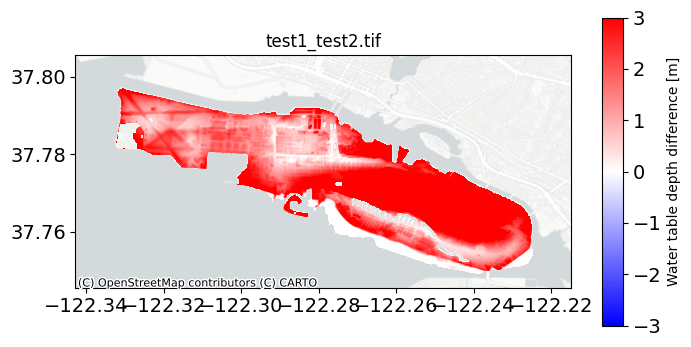

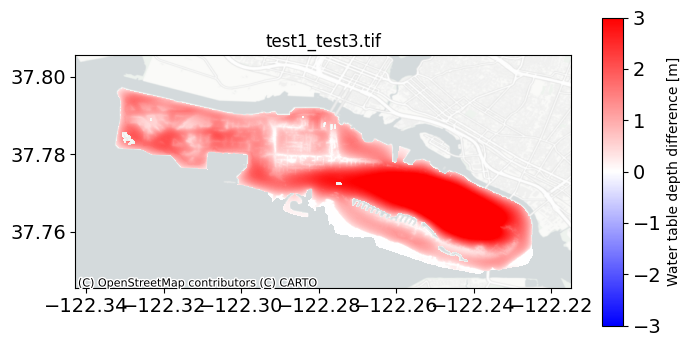

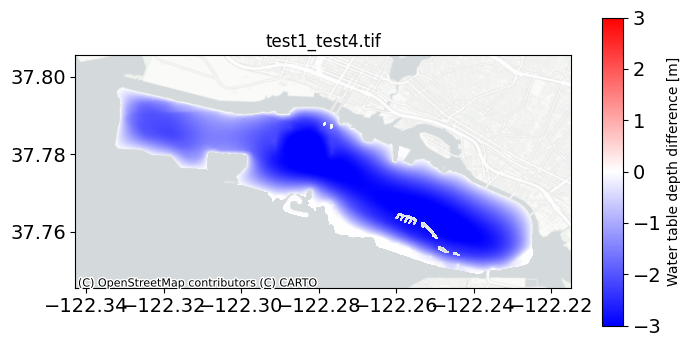

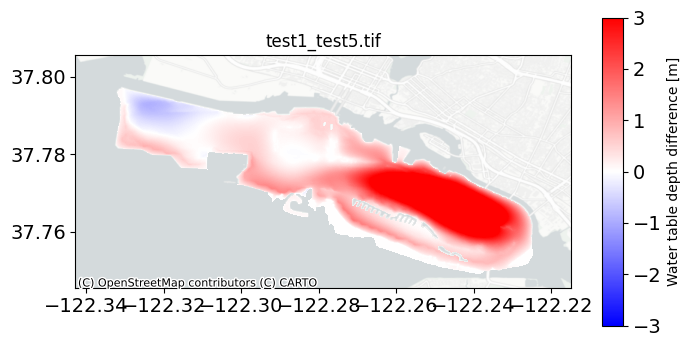

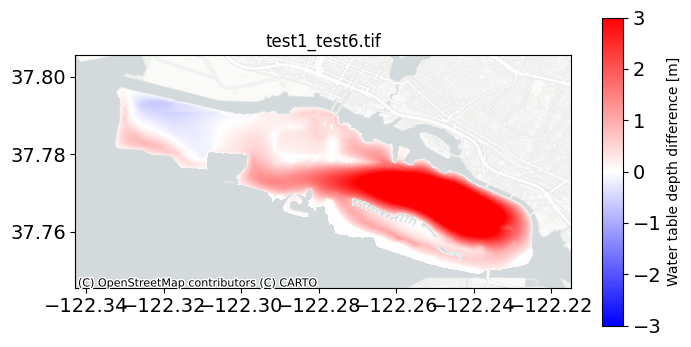

...

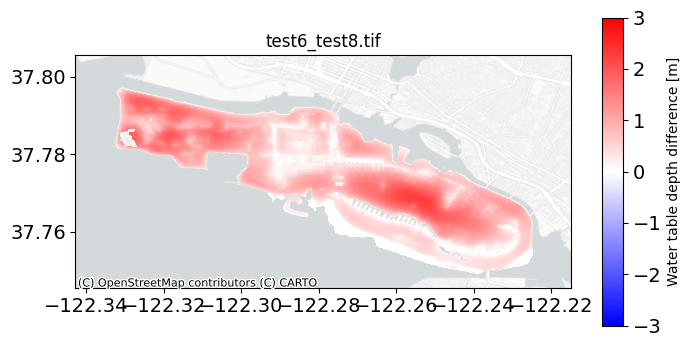

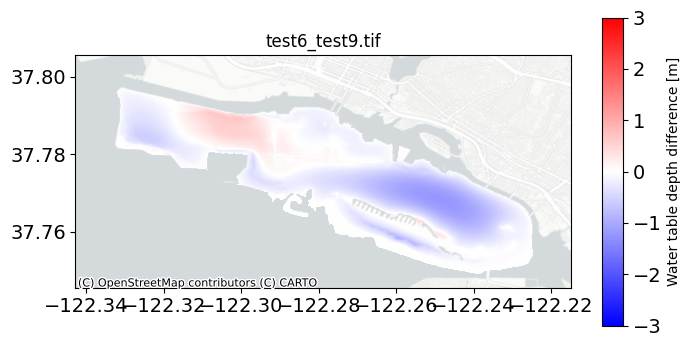

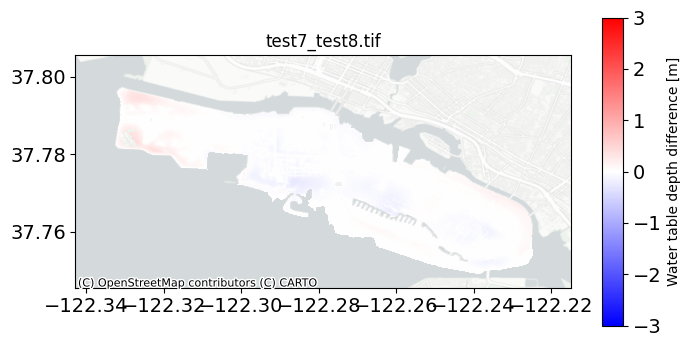

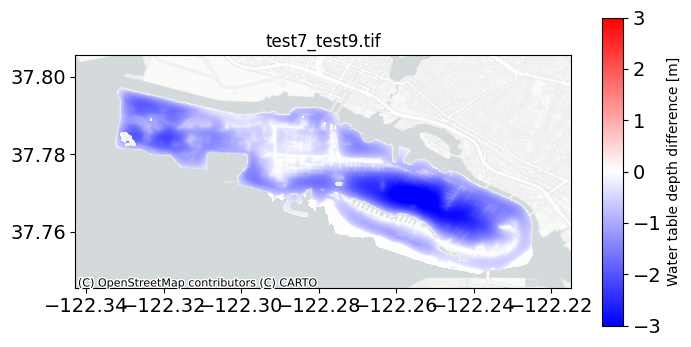

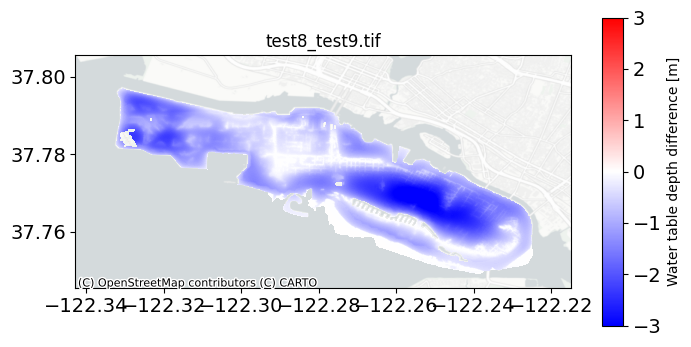

In [19]:
## now load in the differences and plot them

for file in os.listdir(diff_folder):
    if file.endswith(".tif"):
        with rasterio.open(os.path.join(diff_folder, file)) as src:
            diff_arr = src.read(1)
            transform = src.transform
            meta = src.meta
        
        # Mask out no data values
        diff_arr_masked = np.where(diff_arr == -1, np.nan, diff_arr)
        
        # Get bounds
        top_left = xy(transform, 0, 0, offset="ul")
        bottom_right = xy(transform, diff_arr.shape[0] - 1, diff_arr.shape[1] - 1, offset="lr")
        left, top = top_left
        right, bottom = bottom_right
        
        # Plot
        fig, ax = plt.subplots(figsize=(8, 8))
        img = ax.imshow(
            diff_arr_masked,
            extent=(left, right, bottom, top),
            origin="upper",
            cmap="bwr",
            vmin=-3,
            vmax=3
        )
        fig.colorbar(img, label="Water table depth difference [m]", shrink=0.5, aspect=15)
        ctx.add_basemap(
            ax,
            crs=target_crs,
            source=ctx.providers.CartoDB.PositronNoLabels,
            zorder=-1
        )
        plt.title(file)
        plt.show()

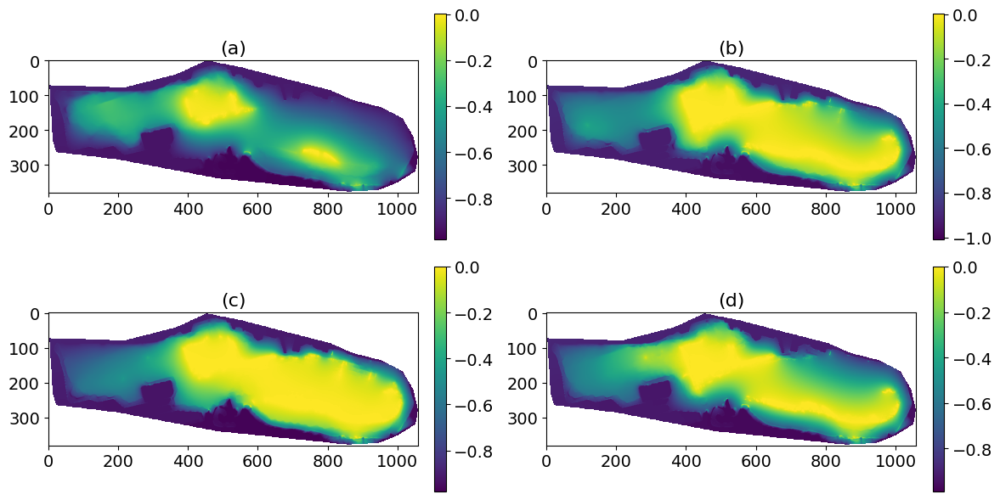

In [20]:
## plot the difference between each test from /MTL/...MTL... and /...MHHW... files
tests = ["test1", "test6", "test5", "test9"]
label = ['(a)', '(b)', '(c)', '(d)']
# make all tick labels font 14
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
fig, axes = plt.subplots(2, 2, figsize=(12, 6))
axes = axes.flatten()  # easier to iterate over a flat list

for ax, test, lab in zip(axes, tests, label):
    mtl_file = folder + f'/alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
    mhhw_file = folder + f'/alameda_0_MHHW_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'

    with rasterio.open(mtl_file) as src:
        mtl_data = src.read(1)
    
    # Read the MHHW data
    with rasterio.open(mhhw_file) as src:
        mhhw_data = src.read(1)
    
    # Compute the difference (e.g., MHHW - MTL)
    diff = mhhw_data - mtl_data
    
    # Plot the difference
    im = ax.imshow(diff, cmap='viridis')
    ax.set_title(lab, fontsize=16)
    
    # Add a colorbar for each subplot
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

In [21]:
folder = './wtdepths_250307/'
target_crs = "EPSG:4326"
base_file = './gtif_base/Alameda_wt_lmsl_noghb_Kh1p0_slr0p00m.tif'
diff_folder = './wtdepths_250307/diff_base'
os.makedirs(diff_folder, exist_ok=True)

###############################################################################
# 1. Reproject the BASE file to EPSG:4326 with the chosen resolution/extent.
###############################################################################
with rasterio.open(base_file) as src_base:
    # Compute default transform/resolution
    transform_base, width_base, height_base = calculate_default_transform(
        src_base.crs,
        target_crs,
        src_base.width,
        src_base.height,
        *src_base.bounds
    )
    
    # Prepare metadata for base
    meta_base = src_base.meta.copy()
    meta_base.update({
        "crs": target_crs,
        "transform": transform_base,
        "width": width_base,
        "height": height_base
    })
    
    # Reproject the base raster into an array of that shape
    reprojected_base = np.empty((src_base.count, height_base, width_base), 
                                dtype=src_base.dtypes[0])
    
    for i in range(1, src_base.count+1):
        reproject(
            source=rasterio.band(src_base, i),
            destination=reprojected_base[i-1],
            src_transform=src_base.transform,
            src_crs=src_base.crs,
            dst_transform=transform_base,
            dst_crs=target_crs,
            resampling=Resampling.nearest
        )

# Take first band and mask
base_arr = reprojected_base[0].astype("float32")
base_arr_masked = np.where(base_arr < -1, np.nan, base_arr)

# We'll store the final (masked) base array, plus the transform/meta
base_reprojected_data = (base_arr_masked, transform_base, meta_base)

###############################################################################
# 2. Reproject each TEST raster onto the SAME grid as base
###############################################################################
reprojected_data_dict = {}

for test_i in inputs['names']:
    test_file = os.path.join(folder, f"alameda_0_MTL_slr0.00m_Kh{test_i}_10m_wtdepth_nofel.tif") # alameda_0_MHHW_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif
    
    with rasterio.open(test_file) as src_test:
        # Note: DO NOT call calculate_default_transform here
        # We want EXACTLY the base transform/width/height
        meta_test = src_test.meta.copy()
        meta_test.update({
            "crs": target_crs,
            "transform": transform_base,
            "width": width_base,
            "height": height_base
        })
        
        # Reproject onto the base grid
        repro_arr = np.empty((src_test.count, height_base, width_base), 
                             dtype=src_test.dtypes[0])
        
        for i in range(1, src_test.count+1):
            reproject(
                source=rasterio.band(src_test, i),
                destination=repro_arr[i-1],
                src_transform=src_test.transform,
                src_crs=src_test.crs,
                dst_transform=transform_base,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    
    # Mask out < -1
    test_arr = repro_arr[0].astype("float32")
    test_arr_masked = np.where(test_arr < -1, np.nan, test_arr)
    
    # Save in dict
    reprojected_data_dict[test_i] = (test_arr_masked, transform_base, meta_test)

###############################################################################
# 3. Compute difference (Test_i - Base) & save
###############################################################################
for test_i in inputs['names']:
    arr_i, transform_i, meta_i = reprojected_data_dict[test_i]
    arr_base, transform_base, meta_base = base_reprojected_data
    
    # Now shapes match: (height_base, width_base)
    diff_arr = arr_i - arr_base
    
    # Update metadata for single-band float32
    diff_meta = meta_i.copy()
    diff_meta.update({
        "dtype": "float32",
        "count": 1
    })
    
    diff_outname = f"{test_i}_baseKh1_MTL.tif"
    diff_outpath = os.path.join(diff_folder, diff_outname)
    
    with rasterio.open(diff_outpath, "w", **diff_meta) as dst:
        dst.write(diff_arr, 1)
    
    print(f"Saved difference: {diff_outpath}")


Saved difference: ./wtdepths_250307/diff_base\test1_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test2_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test3_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test4_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test5_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test6_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test7_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test8_baseKh1_MTL.tif
Saved difference: ./wtdepths_250307/diff_base\test9_baseKh1_MTL.tif


In [22]:
target_crs = "EPSG:4326"

base_file = './gtif_base/Alameda_wt_lmsl_noghb_Kh10p0_slr0p00m.tif'
diff_folder = os.path.join('wtdepths_250307/diff_base')
# -------------------------------------------------------------------------
# 1) Use the FIRST test to define the transform/extent
# -------------------------------------------------------------------------
first_test = inputs['names'][0]
first_test_file = os.path.join(folder, f"alameda_0_MTL_slr0.00m_Kh{first_test}_10m_wtdepth_nofel.tif")

with rasterio.open(first_test_file) as src_first:
    # Compute the transform/extent/resolution from the FIRST test
    transform_test, width_test, height_test = calculate_default_transform(
        src_first.crs,
        target_crs,
        src_first.width,
        src_first.height,
        *src_first.bounds
    )
    
    # We'll store these for reprojecting everything else
    ref_meta = src_first.meta.copy()
    ref_meta.update({
        "crs": target_crs,
        "transform": transform_test,
        "width": width_test,
        "height": height_test
    })

# -------------------------------------------------------------------------
# 2) Reproject the BASE file ONCE onto that same grid
# -------------------------------------------------------------------------
with rasterio.open(base_file) as src_base:
    # Force the base to have the same transform/extent as the first test
    base_meta = src_base.meta.copy()
    base_meta.update({
        "crs": target_crs,
        "transform": transform_test,
        "width": width_test,
        "height": height_test
    })
    
    base_array = np.empty((src_base.count, height_test, width_test), dtype=src_base.dtypes[0])
    
    for i in range(1, src_base.count + 1):
        reproject(
            source=rasterio.band(src_base, i),
            destination=base_array[i - 1],
            src_transform=src_base.transform,
            src_crs=src_base.crs,
            dst_transform=transform_test,
            dst_crs=target_crs,
            resampling=Resampling.nearest
        )

# Take first band (assuming single-band). Convert to float32 if desired.
base_band = base_array[0].astype('float32')
# Mask out no-data below -1
base_band_masked = np.where(base_band < -1, np.nan, base_band)

# -------------------------------------------------------------------------
# 3) Loop over EACH test, reproject onto the SAME grid, subtract, and save
# -------------------------------------------------------------------------
for test_name in inputs['names']:
    test_file = os.path.join(folder, f"alameda_0_MTL_slr0.00m_Kh{test_name}_10m_wtdepth_nofel.tif")
    
    with rasterio.open(test_file) as src_test:
        test_arr = np.empty((src_test.count, height_test, width_test), dtype=src_test.dtypes[0])
        
        # Reproject the test raster onto the same grid as the first test
        for i in range(1, src_test.count + 1):
            reproject(
                source=rasterio.band(src_test, i),
                destination=test_arr[i - 1],
                src_transform=src_test.transform,
                src_crs=src_test.crs,
                dst_transform=transform_test,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    
    # Mask out no-data
    test_band = test_arr[0].astype('float32')
    test_band_masked = np.where(test_band < -1, np.nan, test_band)
    
    # Compute difference: (Test - Base)
    diff_arr = test_band_masked - base_band_masked
    
    # Prepare metadata for the difference
    diff_meta = ref_meta.copy()
    diff_meta.update({
        "dtype": "float32",
        "count": 1
    })
    
    # Save difference
    diff_name = f"{test_name}_baseKh10_MTL.tif"
    diff_path = os.path.join(diff_folder, diff_name)
    
    with rasterio.open(diff_path, 'w', **diff_meta) as dst:
        dst.write(diff_arr, 1)
    
    print(f"Saved difference raster: {diff_name}")


Saved difference raster: test1_baseKh10_MTL.tif
Saved difference raster: test2_baseKh10_MTL.tif
Saved difference raster: test3_baseKh10_MTL.tif
Saved difference raster: test4_baseKh10_MTL.tif
Saved difference raster: test5_baseKh10_MTL.tif
Saved difference raster: test6_baseKh10_MTL.tif
Saved difference raster: test7_baseKh10_MTL.tif
Saved difference raster: test8_baseKh10_MTL.tif
Saved difference raster: test9_baseKh10_MTL.tif


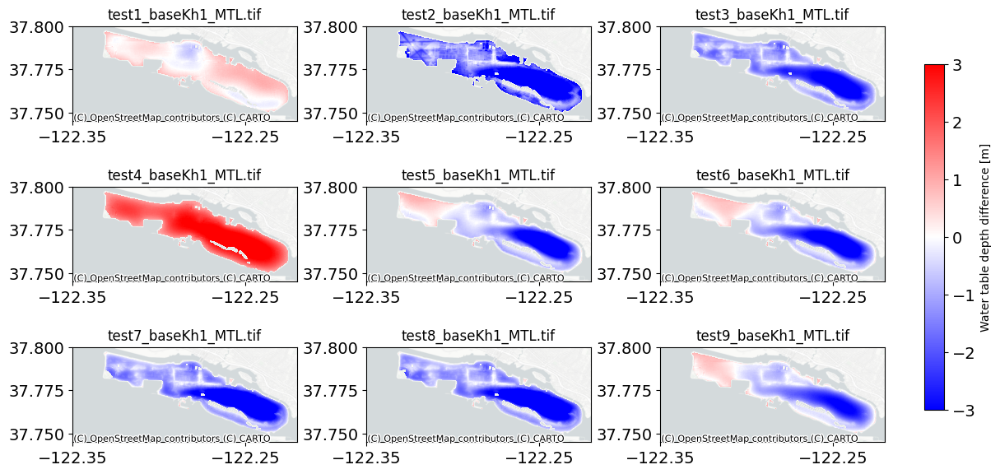

In [23]:
## now load in the differences and plot them

## I want to 

fig, axes= plt.subplots(3, 3, figsize=(12, 6))
axes = axes.flatten()
diff_files = [f for f in os.listdir(diff_folder) if f.endswith("baseKh1_MTL.tif")]

for i, file in enumerate(diff_files):
        with rasterio.open(os.path.join(diff_folder, file)) as src:
            diff_arr = src.read(1)
            transform = src.transform
            meta = src.meta
        
        # Mask out no data values
        diff_arr_masked = np.where(diff_arr == -1, np.nan, diff_arr)
        
        # Get bounds
        top_left = xy(transform, 0, 0, offset="ul")
        bottom_right = xy(transform, diff_arr.shape[0] - 1, diff_arr.shape[1] - 1, offset="lr")
        left, top = top_left
        right, bottom = bottom_right
        
        # Plot
        ax = axes[i]
        img = ax.imshow(
            diff_arr_masked,
            extent=(left, right, bottom, top),
            origin="upper",
            cmap="bwr",
            vmin=-3,
            vmax=3
        )
        # fig.colorbar(img, label="Water table depth difference [m]", shrink=0.5, aspect=15)
        
        ax.set_title(file)
        ax.set_xlim(-122.34, -122.22)
        ax.set_ylim(37.745, 37.8)
        # make half the x ticks
        ax.set_xticks(ax.get_xticks()[::2])
        ctx.add_basemap(
            ax,
            crs=target_crs,
            source=ctx.providers.CartoDB.PositronNoLabels,
            zorder=-1
        )
# make one colorbar for all subplots
fig.tight_layout()
plt.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, label="Water table depth difference [m]")
plt.show()

C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\1028184735.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


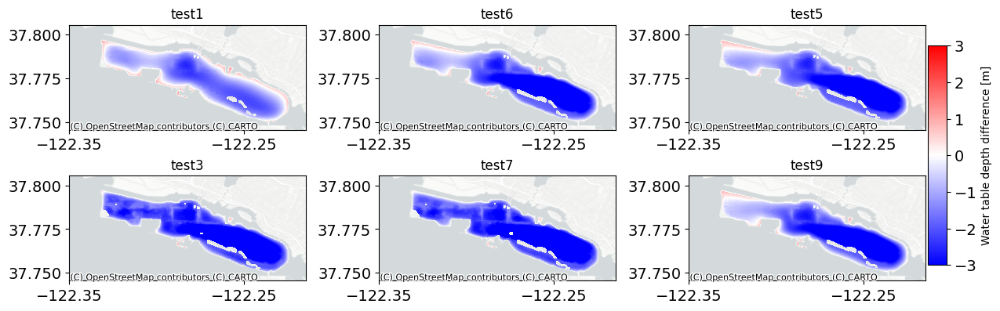

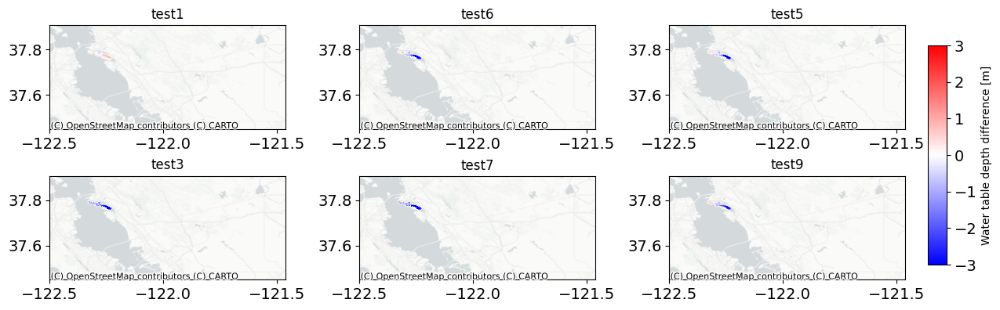

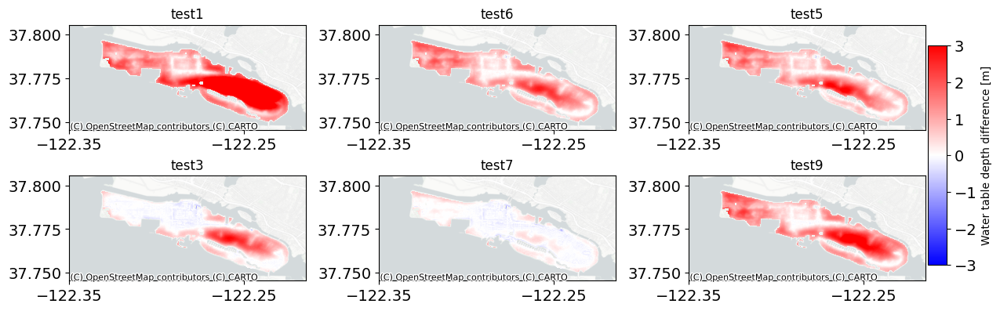

In [24]:
## I want to make a version of the above plots for each of the following file endings
# and I want to just include tests 1/3, 6/7, and 5/9 in that order as above/below so it is 2 rows 3 columns
# so we should loop between file endings first and then between the tests
tests = ["test1", "test6", "test5", "test3", "test7", "test9"]
diff_folder = os.path.join(folder, 'diff_base/')

for file_ending in ["baseKh10_MTL.tif", "baseKh1_MTL.tif", "baseKh01_MTL.tif"]:  #
    fig, axes = plt.subplots(2, 3, figsize=(12, 4))
    axes = axes.flatten()
    diff_files = [f for f in os.listdir(diff_folder) if f.endswith(file_ending)]
    for test in tests:
        file = [f for f in diff_files if test in f][0]
        with rasterio.open(os.path.join(diff_folder, file)) as src:
            diff_arr = src.read(1)
            transform = src.transform
            meta = src.meta
        
        # Mask out no data values
        diff_arr_masked = np.where(diff_arr == -1, np.nan, diff_arr)
        top_left = xy(transform, 0, 0, offset="ul")
        bottom_right = xy(transform, diff_arr.shape[0] - 1, diff_arr.shape[1] - 1, offset="lr")
        left, top = top_left
        right, bottom = bottom_right
        
        # Plot
        ax = axes[tests.index(test)]
        img = ax.imshow(
            diff_arr_masked,
            extent=(left, right, bottom, top),
            origin="upper",
            cmap="bwr",
            vmin=-3,
            vmax=3
        )
        # fig.colorbar(img, label="Water table depth difference [m]", shrink=0.5, aspect=15)
        ax.set_title(test)
        ax.set_xticks(ax.get_xticks()[::2])
        ctx.add_basemap(ax,crs=target_crs,source=ctx.providers.CartoDB.PositronNoLabels,zorder=-1)
        
    # make one colorbar for all subplots
    norm = mpl.colors.Normalize(vmin=-3, vmax=3)
    cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Adjust the colorbar position
    cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap='bwr', norm=norm, orientation='vertical', label='Water table depth difference [m]')

    plt.subplots_adjust(left=0.05, right=0.8, top=0.9, bottom=0.1,wspace=0.1,hspace=0.05)
    fig.tight_layout()

C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\2469849306.py:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


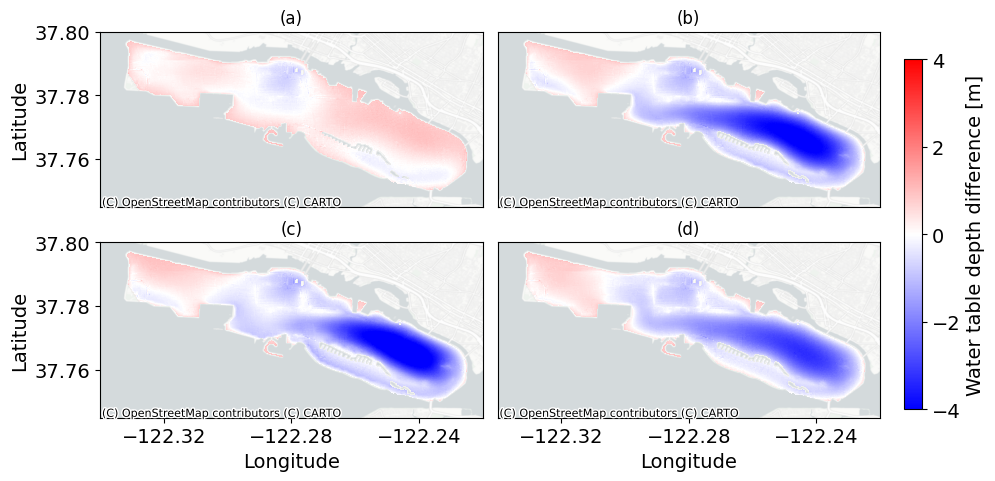

In [25]:
## CLEAN FIGURE

# make all text size 14
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['axes.labelsize'] = 14

tests = ["test1", "test6", "test5", "test9"]
labels = ['(a)', '(b)', '(c)', '(d)']

file_ending = "baseKh1_MTL.tif"
fig, axes = plt.subplots(2, 2, figsize=(9, 5))
axes = axes.flatten()
diff_files = [f for f in os.listdir(diff_folder) if f.endswith(file_ending)]
for ind, test in enumerate(tests):
    file = [f for f in diff_files if test in f][0]
    with rasterio.open(os.path.join(diff_folder, file)) as src:
        diff_arr = src.read(1)
        transform = src.transform
        meta = src.meta
    
    # Mask out no data values
    diff_arr_masked = np.where(diff_arr == -1, np.nan, diff_arr)
    top_left = xy(transform, 0, 0, offset="ul")
    bottom_right = xy(transform, diff_arr.shape[0] - 1, diff_arr.shape[1] - 1, offset="lr")
    left, top = top_left
    right, bottom = bottom_right
    

    ax = axes[tests.index(test)]
    img = ax.imshow(diff_arr_masked,extent=(left, right, bottom, top),origin="upper",cmap="bwr",vmin=-4,vmax=4)
    ax.set_xlim(-122.34, -122.22)
    ax.set_ylim(37.745, 37.8)
    ax.set_title(labels[ind])
    if ind in [0, 2]:
        ax.set_ylabel("Latitude")
    else:
        ax.set_yticks([])
    if ind in [2, 3]:
        ax.set_xlabel('Longitude')
        ax.set_xticks([-122.32, -122.28, -122.24])
    else:
        ax.set_xticks([])
    # ax.set_xticks(ax.get_xticks()[::2])
    ctx.add_basemap(ax,crs=target_crs,source=ctx.providers.CartoDB.PositronNoLabels,zorder=-1)
    
# make one colorbar for all subplots
norm = mpl.colors.Normalize(vmin=-4, vmax=4)
cbar_ax = fig.add_axes([1.01, 0.15, 0.02, 0.7])  # Adjust the colorbar position
cbar = mpl.colorbar.ColorbarBase(cbar_ax, cmap='bwr', norm=norm, orientation='vertical', label='Water table depth difference [m]')
cbar_ax.tick_params(labelsize=14)
# make the cbar labels just 4,2,0,-2,-4
cbar.set_ticks([-4, -2, 0, 2, 4])

plt.subplots_adjust(left=0.05, right=0.7, top=0.9, bottom=0.1,wspace=0.1,hspace=0.05)
fig.tight_layout()
plt.savefig('./figures/test_diffs_MTL.png', dpi=1000, format = 'png', bbox_inches='tight')
plt.savefig('./figures/test_diffs_MTL.pdf', dpi=1000, format = 'pdf', bbox_inches='tight')


C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\1619744202.py:103: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=mpl.cm.get_cmap("magma"), norm=norm_left)
C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\1619744202.py:111: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=mpl.cm.get_cmap("bwr"), norm=norm_right)


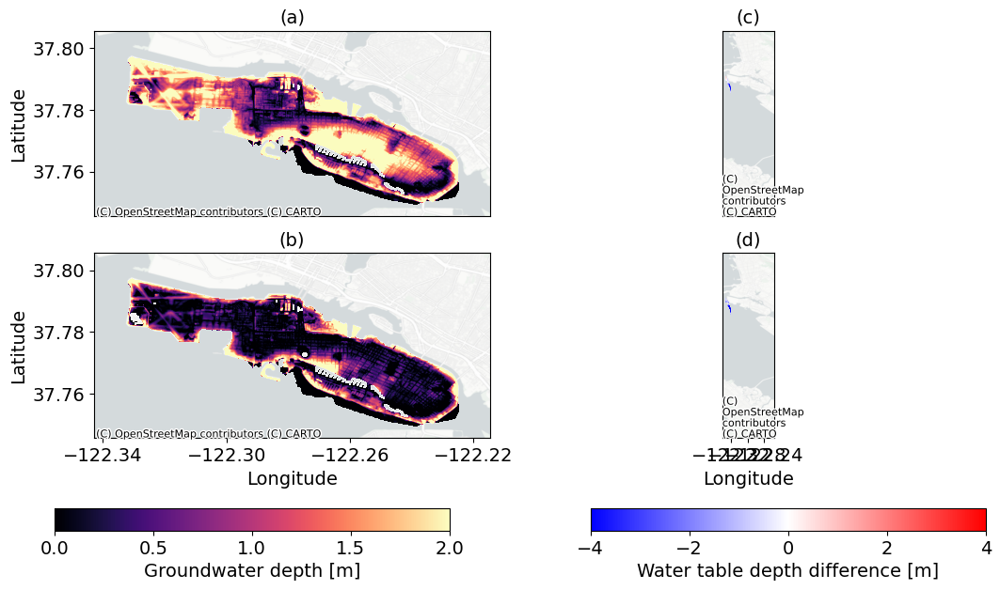

In [26]:
# Set tick label sizes
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14

# Define tests and labels for the two rows
tests = ["test6", "test7"]
labels = ['(a)', '(b)', '(c)', '(d)']

fig, axs = plt.subplots(2, 2, figsize=(12, 6))
# For clarity, assign left and right axes:
ax_left = [axs[0, 0], axs[1, 0]]
ax_right = [axs[0, 1], axs[1, 1]]

# Loop over tests and plot on both left and right columns
for i, test in enumerate(tests):
    # Construct the file path (adjust filename pattern as needed)
    file = folder + 'alameda_0_MTL_slr0.00m_Kh' + test + '_10m_wtdepth_nofel.tif'
    
    # Open the file and reproject to the target CRS
    with rasterio.open(file) as src:
        transform, width, height = calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height})
        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])
        for j in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, j),
                destination=reprojected_data[j - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    
    # Use the first band and mask out no-data values (< -1)
    band1 = reprojected_data[0]
    band1_masked = np.where(band1 < -1, np.nan, band1)

    left_val, top = transform * (0, 0)
    right_val, bottom = transform * (width, height)
    
    # ---------------------------
    # Left column: raw values (magma)
    # ---------------------------
    im_left = ax_left[i].imshow(band1_masked, extent=(left_val, right_val, bottom, top),
                                origin="upper", cmap="magma", vmin=0, vmax=2)
    ax_left[i].set_title(labels[i], fontsize=14)
    ax_left[i].set_ylabel("Latitude", fontsize=14)

    if i == 1:
        ax_left[i].set_xlabel("Longitude", fontsize=14)
        # Optionally adjust x-ticks, e.g.,:
        ax_left[i].set_xticks(ax_left[i].get_xticks()[1::2])
    else:
        ax_left[i].set_xticks([])
    ctx.add_basemap(ax_left[i], crs=target_crs,
                    source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)
    
    # ---------------------------
    # Right column: imshow (bwr)
    # ---------------------------

    file = [f for f in diff_files if test in f][0]
    with rasterio.open(os.path.join(diff_folder, file)) as src:
        diff_arr = src.read(1)
        transform = src.transform
        meta = src.meta
    
    # Mask out no data values
    diff_arr_masked = np.where(diff_arr == -1, np.nan, diff_arr)
    top_left = xy(transform, 0, 0, offset="ul")
    bottom_right = xy(transform, diff_arr.shape[0] - 1, diff_arr.shape[1] - 1, offset="lr")
    left, top = top_left
    right, bottom = bottom_right

    im_right = ax_right[i].imshow(diff_arr_masked, extent=(left_val, right_val, bottom, top),
                                  origin="upper", cmap="bwr", vmin=-4, vmax=4)
    ax_right[i].set_title(labels[i+2], fontsize=14)
    ax_right[i].set_yticks([])
    if i == 1:
        ax_right[i].set_xlabel("Longitude", fontsize=14)
        ax_right[i].set_xticks([-122.32, -122.28, -122.24])  # adjust as needed
    else:
        ax_right[i].set_xticks([])
    ctx.add_basemap(ax_right[i], crs=target_crs,
                    source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)

# Adjust layout so that subplots don't overlap
plt.tight_layout(rect=[0, 0.1, 1, 1])

cbar_left_ax = fig.add_axes([0.125, 0.05, 0.35, 0.04])
cbar_right_ax = fig.add_axes([0.6, 0.05, 0.35, 0.04])

# Left column colorbar (magma)
norm_left = mpl.colors.Normalize(vmin=0, vmax=2)
cbar_left = mpl.colorbar.ColorbarBase(cbar_left_ax, orientation='horizontal',
                                      cmap=mpl.cm.get_cmap("magma"), norm=norm_left)
cbar_left.set_label("Groundwater depth [m]", fontsize=14)
cbar_left.set_ticks([0, 0.5, 1, 1.5, 2])
cbar_left_ax.tick_params(labelsize=14)

# Right column colorbar (bwr)
norm_right = mpl.colors.Normalize(vmin=-4, vmax=4)
cbar_right = mpl.colorbar.ColorbarBase(cbar_right_ax, orientation='horizontal',
                                       cmap=mpl.cm.get_cmap("bwr"), norm=norm_right)
cbar_right.set_label("Water table depth difference [m]", fontsize=14)
cbar_right.set_ticks([-4, -2, 0, 2, 4])
cbar_right_ax.tick_params(labelsize=14)

plt.savefig('./figures/cp_depth_diff.png', dpi=1000, format = 'png', bbox_inches='tight')
plt.savefig('./figures/cp_depth_diff.pdf', dpi=1000, format = 'pdf', bbox_inches='tight')

C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\3486733103.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=mpl.cm.get_cmap("magma"), norm=norm_left)
C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\3486733103.py:105: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=mpl.cm.get_cmap("bwr"), norm=norm_right)


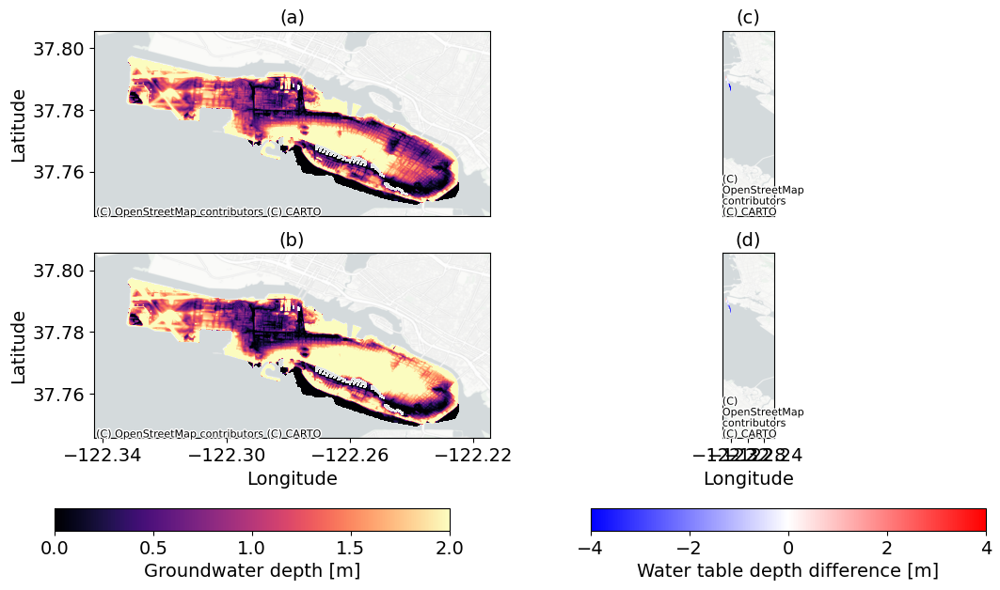

In [27]:
# Define tests and labels for the two rows
tests = ["test5", "test9"]
labels = ['(a)', '(b)', '(c)', '(d)']

fig, axs = plt.subplots(2, 2, figsize=(12, 6))
# For clarity, assign left and right axes:
ax_left = [axs[0, 0], axs[1, 0]]
ax_right = [axs[0, 1], axs[1, 1]]

# Loop over tests and plot on both left and right columns
for i, test in enumerate(tests):
    # Construct the file path (adjust filename pattern as needed)
    file = folder + 'alameda_0_MTL_slr0.00m_Kh' + test + '_10m_wtdepth_nofel.tif'
    
    # Open the file and reproject to the target CRS
    with rasterio.open(file) as src:
        transform, width, height = calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            "crs": target_crs,
            "transform": transform,
            "width": width,
            "height": height})
        reprojected_data = np.empty((src.count, height, width), dtype=src.dtypes[0])
        for j in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, j),
                destination=reprojected_data[j - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_crs,
                resampling=Resampling.nearest
            )
    
    # Use the first band and mask out no-data values (< -1)
    band1 = reprojected_data[0]
    band1_masked = np.where(band1 < -1, np.nan, band1)

    left_val, top = transform * (0, 0)
    right_val, bottom = transform * (width, height)
    
    # ---------------------------
    # Left column: raw values (magma)
    # ---------------------------
    im_left = ax_left[i].imshow(band1_masked, extent=(left_val, right_val, bottom, top),
                                origin="upper", cmap="magma", vmin=0, vmax=2)
    ax_left[i].set_title(labels[i], fontsize=14)
    ax_left[i].set_ylabel("Latitude", fontsize=14)

    if i == 1:
        ax_left[i].set_xlabel("Longitude", fontsize=14)
        # Optionally adjust x-ticks, e.g.,:
        ax_left[i].set_xticks(ax_left[i].get_xticks()[1::2])
    else:
        ax_left[i].set_xticks([])
    ctx.add_basemap(ax_left[i], crs=target_crs,
                    source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)
    
    # ---------------------------
    # Right column: imshow (bwr)
    # ---------------------------
    file = [f for f in diff_files if test in f][0]
    with rasterio.open(os.path.join(diff_folder, file)) as src:
        diff_arr = src.read(1)
        transform = src.transform
        meta = src.meta
    
    # Mask out no data values
    diff_arr_masked = np.where(diff_arr == -1, np.nan, diff_arr)
    top_left = xy(transform, 0, 0, offset="ul")
    bottom_right = xy(transform, diff_arr.shape[0] - 1, diff_arr.shape[1] - 1, offset="lr")
    left, top = top_left
    right, bottom = bottom_right
    im_right = ax_right[i].imshow(diff_arr_masked, extent=(left_val, right_val, bottom, top),
                                  origin="upper", cmap="bwr", vmin=-4, vmax=4)
    ax_right[i].set_title(labels[i+2], fontsize=14)
    ax_right[i].set_yticks([])
    if i == 1:
        ax_right[i].set_xlabel("Longitude", fontsize=14)
        ax_right[i].set_xticks([-122.32, -122.28, -122.24])  # adjust as needed
    else:
        ax_right[i].set_xticks([])
    ctx.add_basemap(ax_right[i], crs=target_crs,
                    source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)

# Adjust layout so that subplots don't overlap
plt.tight_layout(rect=[0, 0.1, 1, 1])

cbar_left_ax = fig.add_axes([0.125, 0.05, 0.35, 0.04])
cbar_right_ax = fig.add_axes([0.6, 0.05, 0.35, 0.04])

# Left column colorbar (magma)
norm_left = mpl.colors.Normalize(vmin=0, vmax=2)
cbar_left = mpl.colorbar.ColorbarBase(cbar_left_ax, orientation='horizontal',
                                      cmap=mpl.cm.get_cmap("magma"), norm=norm_left)
cbar_left.set_label("Groundwater depth [m]", fontsize=14)
cbar_left.set_ticks([0, 0.5, 1, 1.5, 2])
cbar_left_ax.tick_params(labelsize=14)

# Right column colorbar (bwr)
norm_right = mpl.colors.Normalize(vmin=-4, vmax=4)
cbar_right = mpl.colorbar.ColorbarBase(cbar_right_ax, orientation='horizontal',
                                       cmap=mpl.cm.get_cmap("bwr"), norm=norm_right)
cbar_right.set_label("Water table depth difference [m]", fontsize=14)
cbar_right.set_ticks([-4, -2, 0, 2, 4])
cbar_right_ax.tick_params(labelsize=14)

plt.savefig('./figures/thick_thin_depth_diff.png', dpi=1000, format = 'png', bbox_inches='tight')
plt.savefig('./figures/thick_thin_depth_diff.pdf', dpi=1000, format = 'pdf', bbox_inches='tight')

#### Compare with empirical data

In [28]:
## load in the empirical data from .gdb file
gdb_path = "C:\\Users/Emily/Downloads/Alameda_Groundwater_SLR.gdb/Alameda_Groundwater_SLR.gdb"
folder = './wtdepths_250307/'
target_crs = "EPSG:4326"
# List all the layers in the geodatabase
layers = fiona.listlayers(gdb_path)
print("Layers:", layers)

dtw_6 = gpd.read_file(gdb_path, layer='Alameda_GW_DTW_SLR_0_6ft')
dtw_0 = gpd.read_file(gdb_path, layer='Alameda_GW_DTW_SLR_0_emergent')

dtw_6.to_crs('epsg:4326', inplace=True)
dtw_0.to_crs('epsg:4326', inplace=True)


Layers: ['Alameda_GW_DTW_SLR_0_6ft', 'Alameda_GW_DTW_SLR_0_emergent', 'Alameda_GW_DTW_SLR_12_6ft', 'Alameda_GW_DTW_SLR_12_emergent', 'Alameda_GW_DTW_SLR_24_6ft', 'Alameda_GW_DTW_SLR_24_emergent', 'Alameda_GW_DTW_SLR_36_6ft', 'Alameda_GW_DTW_SLR_36_emergent', 'Alameda_GW_DTW_SLR_48_6ft', 'Alameda_GW_DTW_SLR_48_emergent', 'Alameda_GW_DTW_SLR_52_6ft', 'Alameda_GW_DTW_SLR_52_emergent', 'Alameda_GW_DTW_SLR_66_6ft', 'Alameda_GW_DTW_SLR_66_emergent', 'Alameda_GW_DTW_SLR_77_6ft', 'Alameda_GW_DTW_SLR_77_emergent', 'Alameda_GW_DTW_SLR_84_6ft', 'Alameda_GW_DTW_SLR_84_emergent', 'Alameda_GW_DTW_SLR_96_6ft', 'Alameda_GW_DTW_SLR_96_emergent', 'Alameda_GW_DTW_SLR_108_6ft', 'Alameda_GW_DTW_SLR_108_emergent', 'Alameda_Low_Confidence_Areas', 'Alameda_Not_Mapped_Area']


c:\Users\Emily\miniconda3\envs\Kh_env\lib\site-packages\pyogrio\raw.py:198: RuntimeWarning: organizePolygons() received a polygon with more than 100 parts. The processing may be really slow.  You can skip the processing by setting METHOD=SKIP, or only make it analyze counter-clock wise parts by setting METHOD=ONLY_CCW if you can assume that the outline of holes is counter-clock wise defined
  return ogr_read(


Processing test1...


KeyboardInterrupt: 

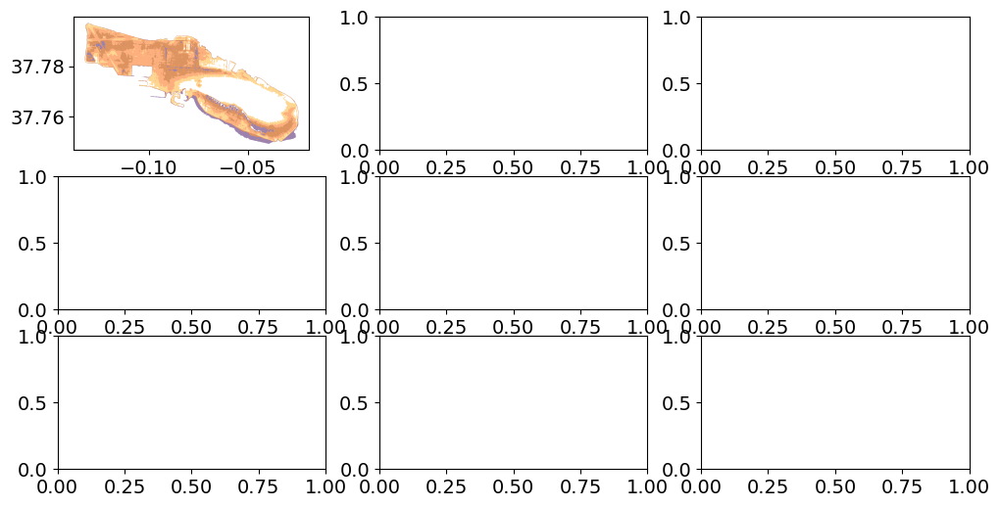

In [29]:
# Define depth thresholds (converted to meters)
depth_bins = {
    '<0 (Emergent)': 0,  # Anything < 0 ft
    '0-3 ft': 3 * 0.3048,  # 0 to 3 ft
    '3-6 ft': 6 * 0.3048,  # 3 to 6 ft
    '6-9 ft': 9 * 0.3048,  # 6 to 9 ft
    '>9 ft': np.inf        # Greater than 9 ft
}

# Define color scheme matching the reference image
# color_map = {
#     '<0 (Emergent)': '#6e2b8e',  # Purple
#     '0-3 ft': '#e6550d',  # Dark Orange
#     '3-6 ft': '#fd8d3c',  # Orange
#     '6-9 ft': '#fdae6b',  # Light Orange
#     '>9 ft': '#ffffcc'  # Yellow
# }
def rgb_to_hex(rgb):
    return '#{:02x}{:02x}{:02x}'.format(*rgb)

# Define color scheme using RGB values
color_to_depth = {
    (112, 68, 137): '<0 (Emergent)',  # Purple
    (217, 96, 12): '0-3 ft',     # Dark Orange
    (253, 141, 60): '3-6 ft',    # Orange
    (254, 204, 92): '6-9 ft',    # Light Orange
    (255, 255, 178): '>9 ft'     # Light Yellow
}
color_map = {desc: rgb_to_hex(rgb) for rgb, desc in color_to_depth.items()}

fig,axes = plt.subplots(3, 3, figsize=(12, 6))
axes = axes.flatten()
for ind,test in enumerate(inputs['names']):
    print(f"Processing {test}...")
    # fig, ax = plt.subplots(figsize=(12, 8))
    file = folder + f'alameda_0_MHHW_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
    ax = axes[ind]
    with rasterio.open(file) as src:
        band1 = src.read(1)  # Read the first band
        transform = src.transform
    
    # Mask out NoData values
    mask = band1 < -1
    band1_masked = np.where(mask, np.nan, band1)

    # Convert raster to vector polygons
    polygons, categories = [], []
    for geom, value in shapes(band1_masked, transform=transform, mask=~mask):
        if not np.isnan(value):
            for category, threshold in depth_bins.items():
                if value <= threshold:
                    polygons.append(shape(geom))
                    categories.append(category)
                    break

    # Check if any valid polygons exist
    if not polygons:
        print(f"Skipping {test}: No valid polygons found.")
        continue

    # Create GeoDataFrame
    gdf = gpd.GeoDataFrame({'category': categories, 'geometry': polygons}, crs=src.crs)

    # Convert to target CRS
    try:
        gdf = gdf.to_crs(target_crs)
    except Exception as e:
        print(f"CRS conversion failed for {test}: {e}")
        continue

    # Ensure gdf is not empty before plotting
    if gdf.empty:
        print(f"Skipping {test}: GeoDataFrame is empty after processing.")
        continue

    # Plot each category separately with assigned colors
    for category, color in color_map.items():
        subset = gdf[gdf['category'] == category]
        if not subset.empty:
            subset.plot(ax=ax, color=color, edgecolor='none', alpha=1)
    ctx.add_basemap(ax, crs=gdf.crs, source=ctx.providers.CartoDB.PositronNoLabels)
    handles = [plt.Rectangle((0,0),1,1, color=color_map[cat]) for cat in color_map]
    ax.set_xticks(ax.get_xticks()[::2])
    ax.set_title(test)
# put a legend with the color scheme ouside on the right
fig.legend(handles, color_map.keys(), title='Depth Categories', bbox_to_anchor=(1.05, 0.5))
plt.tight_layout()
plt.show()


Processing test1...
Processing test6...
Processing test5...
Processing Kh1p0...
Processing test3...
Processing test7...
Processing test9...
Processing Kh0p1...


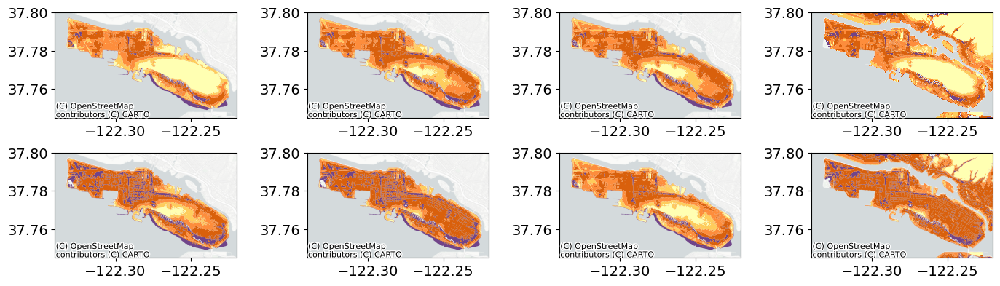

In [ ]:
## make the plot from above but make a fourth column with baseline data from Kh = 0.1 and Kh = 1.0

# from shapely.geometry import box
from pyproj import Transformer

depth_bins = {
    '<0 (Emergent)': 0,  # Anything < 0 ft
    '0-3 ft': 3 * 0.3048,  # 0 to 3 ft
    '3-6 ft': 6 * 0.3048,  # 3 to 6 ft
    '6-9 ft': 9 * 0.3048,  # 6 to 9 ft
    '>9 ft': np.inf        # Greater than 9 ft
}

def rgb_to_hex(rgb):
    return '#{:02x}{:02x}{:02x}'.format(*rgb)

# # # Define color scheme using RGB values
# color_to_depth = {
#     (112, 68, 137, 255): '<0 (Emergent)',  # Purple
#     (217, 96, 12, 255): '0-3 ft',     # Dark Orange
#     (253, 141, 60, 255): '3-6 ft',    # Orange
#     (254, 204, 92, 255): '6-9 ft',    # Light Orange
#     (255, 255, 178, 255): '>9 ft'     # Light Yellow
# }

color_to_depth = {
    (112/255, 68/255, 137/255, 255/255): '<0 (Emergent)',  # Purple
    (217/255, 96/255, 12/255, 255/255): '0-3 ft',          # Dark Orange
    (253/255, 141/255, 60/255, 255/255): '3-6 ft',         # Orange
    (254/255, 204/255, 92/255, 255/255): '6-9 ft',         # Light Orange
    (255/255, 255/255, 178/255, 255/255): '>9 ft'          # Light Yellow
}

depth_to_color = {v: k for k, v in color_to_depth.items()}

target_crs = "EPSG:4326"
# color_map = {desc: rgb_to_hex(rgb) for rgb, desc in color_to_depth.items()}

# color_map = {
#     '<0 (Emergent)':'#704489',  # Purple
#     '0-3 ft':'#d9600c',     # Dark Orange
#     '3-6 ft':'#fd8d3c',    # Orange
#     '6-9 ft':'#fecc5c',    # Light Orange
#     '>9 ft': '#ffffb2'    # Light Yellow
# }


fig,axes = plt.subplots(2, 4, figsize=(14, 4))
axes = axes.flatten()

saved_gdfs = {}
tests = ["test1", "test6", "test5", "Kh1p0", "test3", "test7", "test9", "Kh0p1"]

for ind,test in enumerate(tests):
    print(f"Processing {test}...")
    if test.startswith("test"):
        file = folder + f'alameda_0_MHHW_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
        with rasterio.open(file) as src:
            band1 = src.read(1)
            transform = src.transform
    else:
        file = './gtif_base/Alameda_wt_mhhw_noghb_' + test + '_slr0p00m.tif'
        with rasterio.open(file) as src:
            transformer = Transformer.from_crs("EPSG:4326", src.crs, always_xy=True)
            minx, miny = transformer.transform(-122.34, 37.745)
            maxx, maxy = transformer.transform(-122.22, 37.8)
            window = src.window(minx, miny, maxx, maxy)
            band1 = src.read(1, window=window)
            transform = src.window_transform(window)

    ax = axes[ind]

    # Mask out NoData values
    mask = band1 < -1
    band1_masked = np.where(mask, np.nan, band1)

    # Convert raster to vector polygons
    polygons, categories = [], []
    for geom, value in shapes(band1_masked, transform=transform, mask=~mask):
        if not np.isnan(value):
            for category, threshold in depth_bins.items():
                if value <= threshold:
                    polygons.append(shape(geom))
                    categories.append(category)
                    break
    
    # Check if any valid polygons exist
    if not polygons:
        print(f"Skipping {test}: No valid polygons found.")
        continue

    # Create GeoDataFrame
    gdf = gpd.GeoDataFrame({'category': categories, 'geometry': polygons}, crs=src.crs)

    # Convert to target CRS
    target_crs = "EPSG:4326"
    try:
        gdf = gdf.to_crs(target_crs)
    except Exception as e:
        print(f"CRS conversion failed for {test}: {e}")
        continue
    saved_gdfs[test] = gdf

    gdf['color'] = gdf['category'].map(depth_to_color)
    multi_gdf = gdf.dissolve(by='color')
    multi_gdf.plot(ax=ax, color=multi_gdf.index, edgecolor='none', alpha=1)
    ctx.add_basemap(ax, crs=gdf.crs, source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1,reset_extent=False)
#     # Plot each category separately with assigned colors
#     for category, color in color_map.items():
#         subset = gdf[gdf['category'] == category]
#         if not subset.empty:
#             subset.plot(ax=ax, color=color, edgecolor='none', alpha=1,zorder=1)
#     # print(gdf.crs)
#     # handles = [plt.Rectangle((0,0),1,1, color=color_map[cat]) for cat in color_map]
    # ax.set_xticks(ax.get_xticks()[::2])
    ax.set_xlim(-122.34, -122.22)
    # make x ticks not in scientific notation
    ax.get_xaxis().get_major_formatter().set_useOffset(False)
    ax.set_ylim(37.745, 37.8)
#     ax.set_title(test)
# # put a legend with the color scheme ouside on the right
# # fig.legend(handles, color_map.keys(), title='Depth Categories', bbox_to_anchor=(1.05, 0.5))
plt.tight_layout()

plt.show()


In [ ]:
# check if all geometries are polygon
color_to_depth = {
    (112/255, 68/255, 137/255, 255/255): '<0 (Emergent)',  # Purple
    (217/255, 96/255, 12/255, 255/255): '0-3 ft',          # Dark Orange
    (253/255, 141/255, 60/255, 255/255): '3-6 ft',         # Orange
    (254/255, 204/255, 92/255, 255/255): '6-9 ft',         # Light Orange
    (255/255, 255/255, 178/255, 255/255): '>9 ft'          # Light Yellow
}

depth_to_color = {v: k for k, v in color_to_depth.items()}

gdf = saved_gdfs['Kh0p1']
gdf['color'] = gdf['category'].map(depth_to_color)
gdf

,category,geometry,color
0,3-6 ft,"POLYGON ((-122.32951 37.80067, -122.32951 37.8...","(0.9921568627450981, 0.5529411764705883, 0.235..."
1,0-3 ft,"POLYGON ((-122.3294 37.80067, -122.3294 37.800...","(0.8509803921568627, 0.3764705882352941, 0.047..."
2,<0 (Emergent),"POLYGON ((-122.32928 37.80067, -122.32928 37.8...","(0.4392156862745098, 0.26666666666666666, 0.53..."
3,<0 (Emergent),"POLYGON ((-122.3286 37.80067, -122.3286 37.800...","(0.4392156862745098, 0.26666666666666666, 0.53..."
4,3-6 ft,"POLYGON ((-122.32497 37.80065, -122.32497 37.8...","(0.9921568627450981, 0.5529411764705883, 0.235..."
...,...,...,...
341807,<0 (Emergent),"POLYGON ((-122.22117 37.7444, -122.22117 37.74...","(0.4392156862745098, 0.26666666666666666, 0.53..."
341808,<0 (Emergent),"POLYGON ((-122.22105 37.7444, -122.22105 37.74...","(0.4392156862745098, 0.26666666666666666, 0.53..."
341809,<0 (Emergent),"POLYGON ((-122.22094 37.7444, -122.22094 37.74...","(0.4392156862745098, 0.26666666666666666, 0.53..."
341810,<0 (Emergent),"POLYGON ((-122.22083 37.7444, -122.22083 37.74...","(0.4392156862745098, 0.26666666666666666, 0.53..."


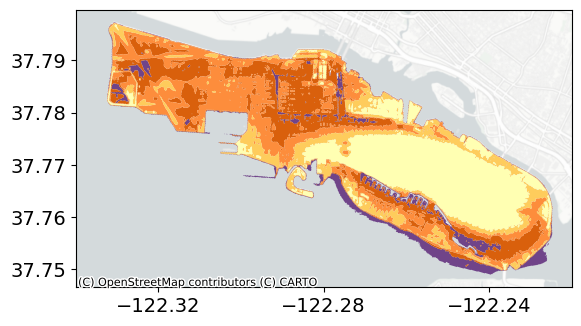

In [ ]:
target_crs = "EPSG:4326"
gdf.to_crs(target_crs, inplace=True)

gdf['color'] = gdf['category'].map(depth_to_color)
multi_gdf = gdf.dissolve(by='color')
ax = multi_gdf.plot(color=multi_gdf.index, alpha=1,zorder=1)

# fig, ax = plt.subplots(figsize=(8, 4))
# # for category, color in color_map.items():
# #     subset = gdf[gdf['category'] == category]
# #     if not subset.empty:
# #         print(color)
# #         subset.plot(ax=ax, color=color, edgecolor='none', alpha=1,zorder=1000)
# gdf.plot(ax=ax, color=gdf['color'], alpha=1,zorder=-1)
ax.set_xticks(ax.get_xticks()[1::2])
ax.set_xlim(-122.34, -122.22)
ctx.add_basemap(ax, crs=gdf.crs, source=ctx.providers.CartoDB.PositronNoLabels, zorder=-1)
# plt.tight_layout()
plt.show()

In [30]:
folder = './wtdepths_250130/'

In [31]:
def reproject_raster_band_in_memory(input_raster_path, band_index=1, target_crs='EPSG:4326'):
    with rasterio.open(input_raster_path) as src:
        # Calculate the transform and dimensions for the new CRS
        transform, width, height = calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds)

        # Prepare an array to hold the reprojected data for the specified band
        band_data = np.zeros((height, width), dtype=src.dtypes[band_index - 1])

        # Reproject the specified band
        reproject(
            source=rasterio.band(src, band_index),
            destination=band_data,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs=target_crs,
            resampling=Resampling.nearest)

        return band_data, transform, width, height
    
def align_rasters(target_raster_path, input_raster_path):
    with rasterio.open(target_raster_path) as target:
        # Use the target's transform and dimensions
        target_transform = target.transform
        target_width = target.width
        target_height = target.height

        target_band = target.read(1, masked=True)

        with rasterio.open(input_raster_path) as input_r:
            # Calculate the necessary transform and output dimensions for alignment
            transform, width, height = calculate_default_transform(
                input_r.crs, target.crs, input_r.width, input_r.height,
                *input_r.bounds, dst_width=target_width, dst_height=target_height, dst_transform=target_transform)

            kwargs = input_r.meta.copy()
            kwargs.update({
                'crs': target.crs,
                'transform': target_transform,
                'width': target_width,
                'height': target_height
            })

            # Create an array to hold the reprojected data
            reprojected_band = np.full((target_height, target_width), np.nan, dtype=np.float32)

            # Reproject the data
            reproject(
                source=rasterio.band(input_r, 1),
                destination=reprojected_band,
                src_transform=input_r.transform,
                src_crs=input_r.crs,
                dst_transform=target_transform,
                dst_crs=target.crs,
                resampling=Resampling.nearest)

    return target_band, reprojected_band, target_transform

#### Test the empirical groundwater data from Adam's google drive (full raster)

In [34]:
def align_rasters(target_raster_path, input_raster_path):
    with rasterio.open(target_raster_path) as target:
        # Use the target's transform and dimensions
        target_transform = target.transform
        target_width = target.width
        target_height = target.height

        target_band = target.read(1, masked=True)

        with rasterio.open(input_raster_path) as input_r:
            # Calculate the necessary transform and output dimensions for alignment
            transform, width, height = calculate_default_transform(
                input_r.crs, target.crs, input_r.width, input_r.height,
                *input_r.bounds, dst_width=target_width, dst_height=target_height, dst_transform=target_transform)

            kwargs = input_r.meta.copy()
            kwargs.update({
                'crs': target.crs,
                'transform': target_transform,
                'width': target_width,
                'height': target_height
            })

            # Create an array to hold the reprojected data
            reprojected_band = np.full((target_height, target_width), np.nan, dtype=np.float32)

            # Reproject the data
            reproject(
                source=rasterio.band(input_r, 1),
                destination=reprojected_band,
                src_transform=input_r.transform,
                src_crs=input_r.crs,
                dst_transform=target_transform,
                dst_crs=target.crs,
                resampling=Resampling.nearest)

    return target_band, reprojected_band, target_transform

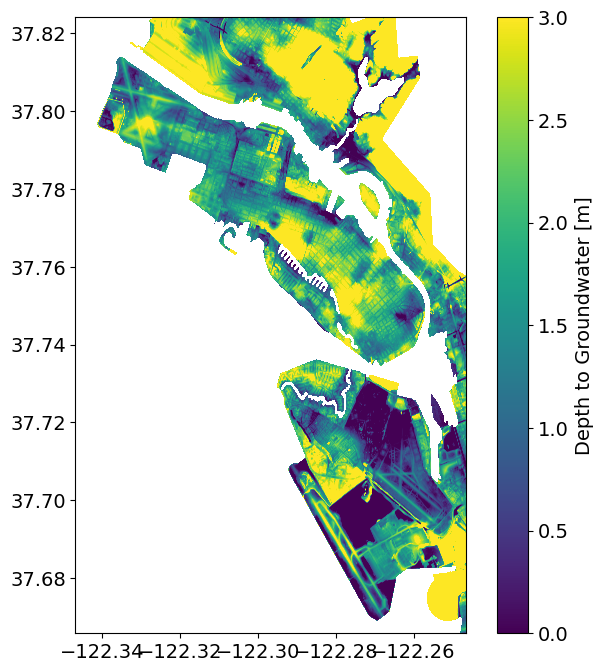

In [35]:
# load data from users/emily/Downloads/Alameda_Groundwater/Existing_DTW_Groundwater1.tif
# and plot it

file = "C:\\Users\\Emily\\Downloads\\Alameda_Groundwater\\Existing_DTW_Groundwater1.tif"
with rasterio.open(file) as src:
    dtw_band = src.read(1)
    transform = src.transform
    crs = src.crs
# mask out points that are < -1000
dtw_band[dtw_band < -1000] = np.nan

newfile = "C:\\Users/Emily/Documents/Work/Existing_DTW_reproj.tif"

target_crs = 'EPSG:4326'
# reproject to newfile with dest_crs
with rasterio.open(file) as src:
    # Read the input data
    data = src.read(1, masked=True)  # Considering data is in the 1st band
    data_masked = np.ma.masked_invalid(data)
    old_nodata_value = src.nodata
    data_masked = np.where(data_masked == old_nodata_value, np.nan, data_masked)
    transform, width, height = calculate_default_transform(src.crs, target_crs, src.width, src.height, *src.bounds)

    profile = src.profile
    profile.update(
        crs=target_crs,
        transform=transform,
        width=width,
        height=height,
        dtype='float32',  # Set the desired data type for the output dataset ('ComplexInt16' to 'float32')
        nodata=np.nan,  # Set the new nodata value for the output dataset
        driver='GTiff'
    )

    # Perform the reprojection and directly write to the output GeoTIFF
    with rasterio.open(newfile, 'w', **profile, BIGTIFF='YES', TILED='YES', COPY_SRC_OVERVIEWS='YES', COMPRESS='DEFLATE') as dst:
        reproject(
            source=data_masked,
            src_transform=src.transform,
            src_crs=src.crs,
            destination=rasterio.band(dst, 1),
            dst_transform=transform,
            dst_crs=target_crs,
            resampling=Resampling.nearest,  
            dst_nodata=np.nan  # Set the new nodata value for the output dataset
        )

# plot the data
fig, ax = plt.subplots(figsize=(8, 8))
img = ax.imshow(dtw_band*0.3048, cmap='viridis', extent=rasterio.plot.plotting_extent(dtw_band, transform),vmin=0, vmax=3)
# ctx.add_basemap(ax, crs=crs, source=ctx.providers.CartoDB.PositronNoLabels)
plt.colorbar(img, label='Depth to Groundwater [m]')
plt.show()


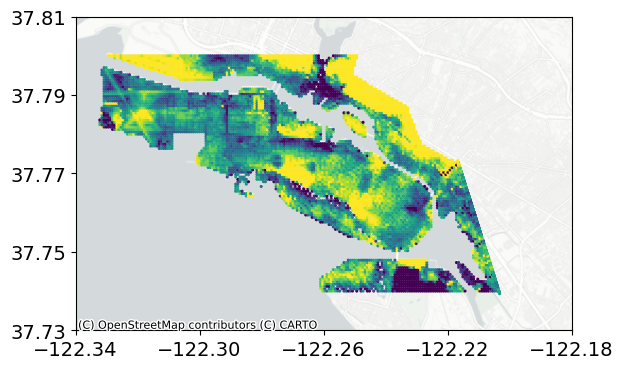

In [36]:
# load and plot the data from the same folder but Alameda_GWT.geojson
file = "C:\\Users\\Emily\\Downloads\\Alameda_Groundwater\\Alameda_GWT.geojson"
gdf = gpd.read_file(file)
# remove any points that are < -1000
gdf = gdf[gdf['data'] > -1000]
gdf['data'] = gdf['data']*0.3048
ax = gdf.plot(column='data', vmax=3, markersize=1.5)
ctx.add_basemap(ax=ax,crs=gdf.crs, source=ctx.providers.CartoDB.PositronNoLabels)
ax.set_xticks(ax.get_xticks()[::2])
ax.set_yticks(ax.get_yticks()[::2])

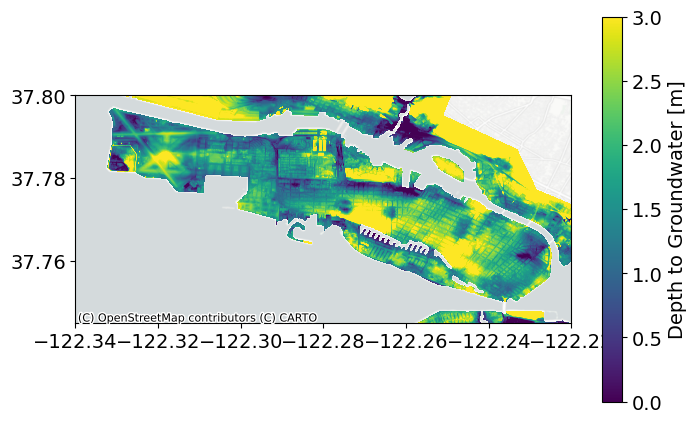

In [37]:
## now calculate the differences between the depths in gdf and the depths in my models and the depth from kevin's Kh=1.0
## use the tif since it has the highest resolution

with rasterio.open(newfile) as src:
    dtw_band = src.read(1)
    transform = src.transform
    crs = src.crs

# mask points that are <1000
dtw_band[dtw_band < -1000] = np.nan

fig, ax = plt.subplots(figsize=(8, 5))
img = ax.imshow(dtw_band*0.3048, cmap='viridis', extent=rasterio.plot.plotting_extent(dtw_band, transform),vmin=0, vmax=3,zorder=1)
ax.set_xlim(-122.34, -122.22)
ax.set_ylim(37.745, 37.8)
ctx.add_basemap(ax, crs=crs, source=ctx.providers.CartoDB.PositronNoLabels,zorder=-1)
plt.colorbar(img, label='Depth to Groundwater [m]')
plt.show()

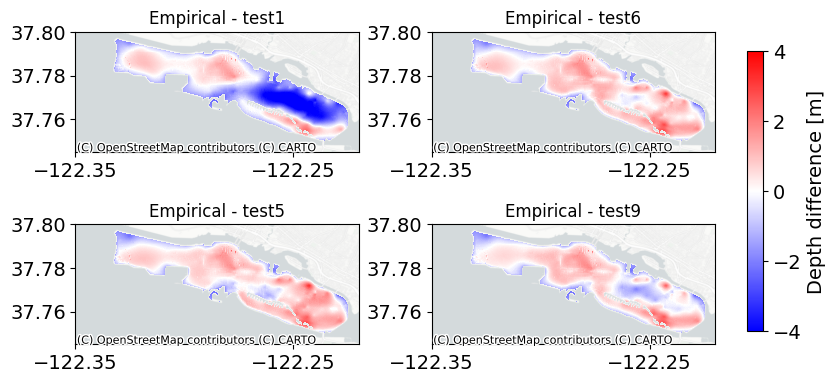

In [38]:
## calculate the differences
## plot these differences but just for the 6 in tests
folder = './wtdepths_250307/'
tests = ["test1", "test6", "test5", "test9"]
labels = ['(a)', '(b)','(c)', '(d)']

fig, axes = plt.subplots(2, 2, figsize=(8, 4))
axes = axes.flatten()
for ind, test in enumerate(tests):
    ax = axes[ind]
    test1_path = os.path.join(folder, f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif')
    depth_band, aligned_test_band, target_transform = align_rasters(newfile, test1_path)

    aligned_test_band[aligned_test_band == -9999] = np.nan
    depth_band[depth_band <= -9999] = np.nan
    # Calculate the difference, setting NaN where one or both arrays have no data
    difference = np.where(
        np.isnan(depth_band) | np.isnan(aligned_test_band), 
        np.nan, 
        depth_band*0.3048 - aligned_test_band
    )
    extent = rasterio.plot.plotting_extent(aligned_test_band, target_transform)
    # Visualize the result
    img = ax.imshow(difference, cmap='bwr',extent=extent, vmin=-4, vmax=4, zorder=10)  # convert feet to m by multiplying by 0.3048
    ax.set_title('Empirical - '+test)
    ax.set_xlim(-122.34, -122.22)
    ax.set_xticks(ax.get_xticks()[::2])
    ax.set_ylim(37.745, 37.8)
    ctx.add_basemap(ax=ax, crs='EPSG:4326', source=ctx.providers.CartoDB.PositronNoLabels,zorder=-1)
fig.tight_layout()
plt.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, label="Depth difference [m]")
plt.show()


In [39]:
depth_band.shape

(13581, 14951)

Processing test1...
Processing test6...
Processing test5...
Processing Kh1p0...
Processing test3...
Processing test7...
Processing test9...
Processing Kh0p1...


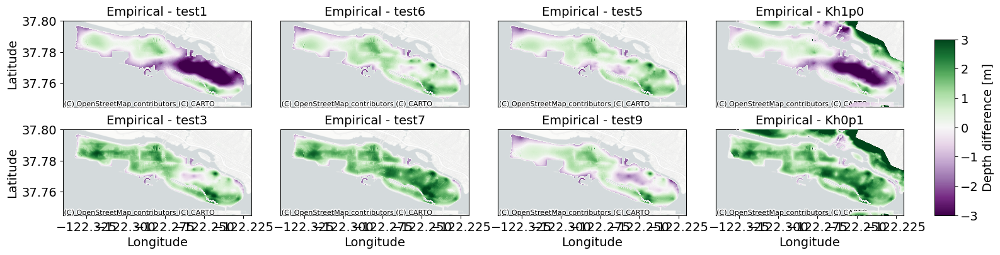

In [40]:
## make the plot from above but make a fourth column with baseline data from Kh = 0.1 and Kh = 1.0

fig,axes = plt.subplots(2, 4, figsize=(16, 4))
axes = axes.flatten()

# saved_diffs = {}
tests = ["test1", "test6", "test5", "Kh1p0", "test3", "test7", "test9", "Kh0p1"]

for ind,test in enumerate(tests):
    print(f"Processing {test}...")
    if test.startswith("test"):
        file = folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
    else:
        file = './gtif_base/Alameda_wt_lmsl_noghb_' + test + '_slr0p00m.tif'

    ax = axes[ind]
    depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
    
    # Replace nodata values with np.nan
    aligned_test_band[aligned_test_band == -9999] = np.nan
    depth_band[depth_band <= -9999] = np.nan
    
    # Calculate the difference: (empirical - test)
    difference = np.where(
        np.isnan(depth_band) | np.isnan(aligned_test_band),
        np.nan,
        depth_band * 0.3048 - aligned_test_band
    )
    difference = difference.astype(np.float16)  # or np.float16 if less precision is acceptable

    c_lim = 3
    extent = plotting_extent(aligned_test_band, target_transform)
    img = ax.imshow(difference, cmap='PRGn', extent=extent, vmin=-c_lim, vmax=c_lim, zorder=10)  # bwr
    
    ax.set_title('Empirical - ' + test, fontsize=14)
    ax.set_xlim(-122.34, -122.22)
    ax.set_ylim(37.745, 37.8)
    if ind in [0,4]:
        ax.set_ylabel('Latitude',fontsize=14)
    else:
        ax.set_yticks([])
    if ind in [4,5,6,7]:
        ax.set_xlabel('Longitude',fontsize=14)
        # ax.set_xticks(ax.get_xticks()[::2])
    else:
        ax.set_xticks([])
    ax.set_xlim(-122.34, -122.22)
    ax.set_ylim(37.745, 37.8)
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.PositronNoLabels)

plt.tight_layout(h_pad=2)
plt.subplots_adjust(right=0.92)  
cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
fig.colorbar(img, cax=cbar_ax, label="Depth difference [m]")
plt.show()


Processing test1...
Processing test6...
Processing test5...
Processing Kh1p0...
Processing test3...
Processing test7...


KeyboardInterrupt: 

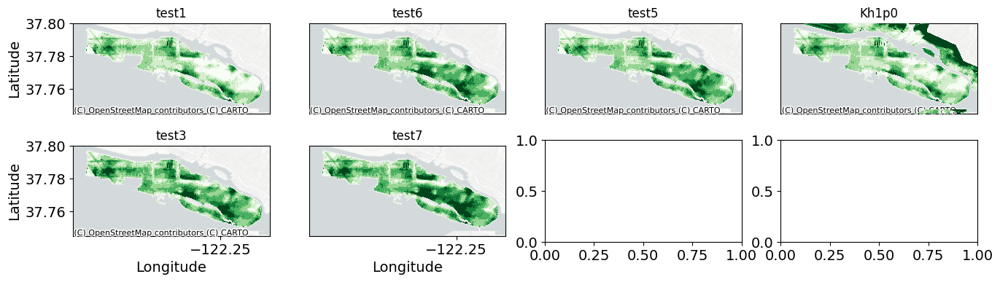

In [41]:
## same as above but take the differences and make them categorical, then plot with increasing dark greens

c_lim = 3
boundaries = np.arange(0, c_lim + 0.5, 0.5)
norm = colors.BoundaryNorm(boundaries, ncolors=plt.get_cmap('Greens').N, clip=True)

# saved_diffs = {}  ## only run once

fig,axes = plt.subplots(2, 4, figsize=(16, 4))
axes = axes.flatten()
## make the plot from above but make a fourth column with baseline data from Kh = 0.1 and Kh = 1.0
for ind,test in enumerate(tests):
    print(f"Processing {test}...")
    if test.startswith("test"):
        file = folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
    else:
        file = './gtif_base/Alameda_wt_lmsl_noghb_' + test + '_slr0p00m.tif'

    ax = axes[ind]
    depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
    ## close any open data
    
    
    # Replace nodata values with np.nan
    aligned_test_band[aligned_test_band == -9999] = np.nan
    depth_band[depth_band <= -9999] = np.nan
    
    # Calculate the difference: (empirical - test)
    difference = np.where(
        np.isnan(depth_band) | np.isnan(aligned_test_band),
        np.nan,
        depth_band - aligned_test_band
    )
    # saved_diffs[test] = difference  # only run once
    
    # make the differences categorical
    difference = np.round(difference * 2) / 2

    # Get the extent for plotting and convert from feet to meters (0.3048 conversion)
    extent = plotting_extent(aligned_test_band, target_transform)
    # img = ax.imshow(difference * 0.3048, cmap='Greens', extent=extent, vmin=0, vmax=c_lim, zorder=10)  # bwr
    img = ax.imshow(difference * 0.3048, cmap='Greens', norm=norm, extent=extent, zorder=10)

    ax.set_title(test)

    if ind in [0,4]:
        ax.set_ylabel('Latitude')
    else:
        ax.set_yticks([])
    if ind in [4,5,6,7]:
        ax.set_xlabel('Longitude')
        ax.set_xticks(ax.get_xticks()[::2])
    else:
        ax.set_xticks([])
        
    ax.set_xlim(-122.34, -122.22)
    ax.set_ylim(37.745, 37.8)
    # Add basemap (make sure your CRS is EPSG:4326)
    ctx.add_basemap(ax, crs='EPSG:4326', source=ctx.providers.CartoDB.PositronNoLabels)

plt.tight_layout()
plt.subplots_adjust(right=0.92)  
cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
# fig.colorbar(img, cax=cbar_ax, label="Depth difference [m]")
fig.colorbar(img, cax=cbar_ax, ticks=boundaries, label="Height above empirical data [m]")

plt.show()


In [42]:
for ind, test in enumerate(tests):
    if "test" in test:
        file = folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
    else:
        file = './gtif_base/Alameda_wt_lmsl_noghb_' + test + '_slr0p00m.tif'

    with rasterio.open(file) as src:
        print(src.crs)

EPSG:32610
EPSG:32610
EPSG:32610
EPSG:3717
EPSG:32610
EPSG:32610
EPSG:32610
EPSG:3717


In [43]:
import rasterio
from rasterio.warp import transform as warp_transform

def get_any_tiff_value(geotiff_file, lat, lon):
    # Assume input coordinates are in EPSG:4326.
    source_crs = 'EPSG:4326'
    
    with rasterio.open(geotiff_file) as src:
        tif_crs = src.crs
        
        # If the TIFF's CRS is different from EPSG:4326, reproject the coordinates.
        if tif_crs != source_crs:
            # warp_transform returns lists for x and y.
            transformed_lon, transformed_lat = warp_transform(source_crs, tif_crs, [lon], [lat])
            lon, lat = transformed_lon[0], transformed_lat[0]
        
        # Convert geographic coordinates to pixel coordinates.
        row, col = src.index(lon, lat)
        
        # Read the value from the first band using a 1x1 window.
        value = src.read(1, window=((row, row+1), (col, col+1)))
    
    return value[0][0]


In [44]:
def get_any_tiff_values(geotiff_file, lats, lons):
    """
    Get flood depth values from a GeoTIFF file for lists of latitude and longitude coordinates.
    
    Parameters:
      geotiff_file (str): Path to the GeoTIFF file.
      lats (list or array): List of latitudes (assumed in EPSG:4326).
      lons (list or array): List of longitudes (assumed in EPSG:4326).
    
    Returns:
      numpy.ndarray: An array of flood depth values corresponding to the provided coordinates.
                     If a coordinate is outside the raster bounds or causes an error, np.nan is returned.
    """
    source_crs = 'EPSG:4326'
    
    with rasterio.open(geotiff_file) as src:
        tif_crs = src.crs
        # Transform coordinates if necessary
        if tif_crs != source_crs:
            transformed_lon, transformed_lat = warp_transform(source_crs, tif_crs, lons, lats)
        else:
            transformed_lon, transformed_lat = lons, lats

        # Read the entire band once
        band = src.read(1)
        values = []
        for x, y in zip(transformed_lon, transformed_lat):
            try:
                # Get pixel indices corresponding to the transformed coordinates
                row, col = src.index(x, y)
                # Check if the indices are within the bounds of the raster
                if 0 <= row < band.shape[0] and 0 <= col < band.shape[1]:
                    values.append(band[row, col])
                else:
                    values.append(np.nan)
            except Exception:
                values.append(np.nan)
    
    return np.array(values)


In [45]:
for ind, test in enumerate(tests):
    if "test" in test:
        file = folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
    else:
        file = './gtif_base/Alameda_wt_lmsl_noghb_' + test + '_slr0p00m.tif'
    
    depths = get_any_tiff_values(file, gdf['geometry'].y.tolist(), gdf['geometry'].x.tolist())
    gdf[test] = depths

In [46]:
## remove any rows with NaN values
gdf = gdf.dropna()

<Axes: >

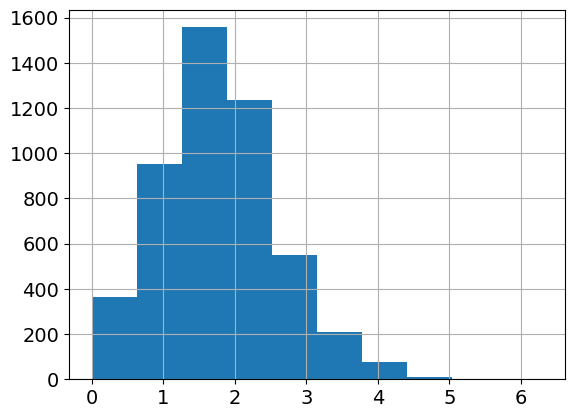

In [47]:
gdf['data'].hist()

In [48]:
gdf[gdf['Kh0p1']==-500]

# store the indices where Kh0p1 and Kh1p0 are -500
idx01 = gdf[gdf['Kh0p1']==-500].index
idx10 = gdf[gdf['Kh1p0']==-500].index


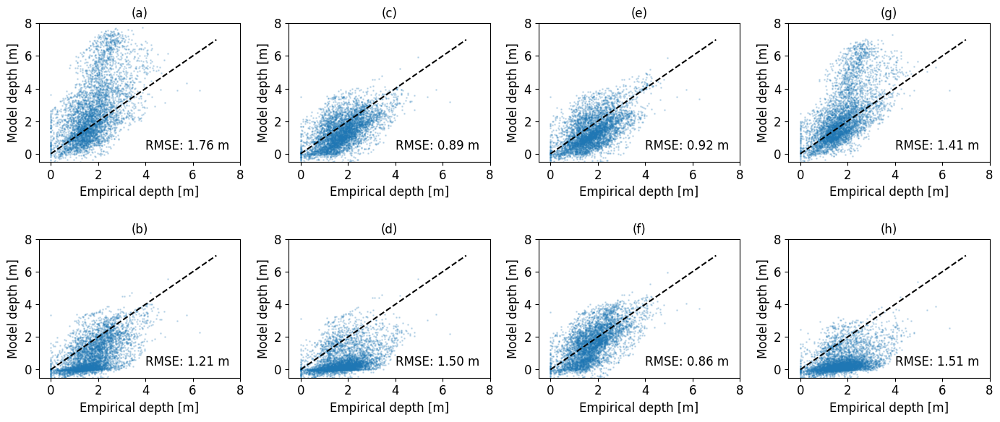

In [49]:
## calculate and print the rmse on the plot
## make all font sizes 12
plt.rc('font', size=12)
plt.rc('axes', titlesize=12)
plt.rc('axes', labelsize=12)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('legend', fontsize=12)
plt.rc('figure', titlesize=12)

labels = ['(a)', '(c)', '(e)', '(g)', '(b)', '(d)', '(f)', '(h)']
fig,axes = plt.subplots(2, 4, figsize=(14, 6))
axes = axes.flatten()

for ind, test in enumerate(tests):
    ax = axes[ind]

    # find rmse between empirical and test
    rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))

    ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
    ax.plot([0,7],[0,7], color='k', linestyle='--')
    ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
    ax.set_xlim(-0.5,8)
    ax.set_xticks([0,2,4,6,8])
    ax.set_yticks([0,2,4,6,8])
    ax.set_ylim(-0.5,8)
    ax.set_xlabel('Empirical depth [m]')
    ax.set_ylabel('Model depth [m]')
    ax.set_title(labels[ind])
plt.tight_layout(h_pad=2)
plt.savefig('figures/wd_emp_scatter_MTL.png', dpi=1000, bbox_inches='tight',format='png')
plt.savefig('figures/wd_emp_scatter_MTL.pdf', dpi=1000, bbox_inches='tight',format='pdf')
plt.show()

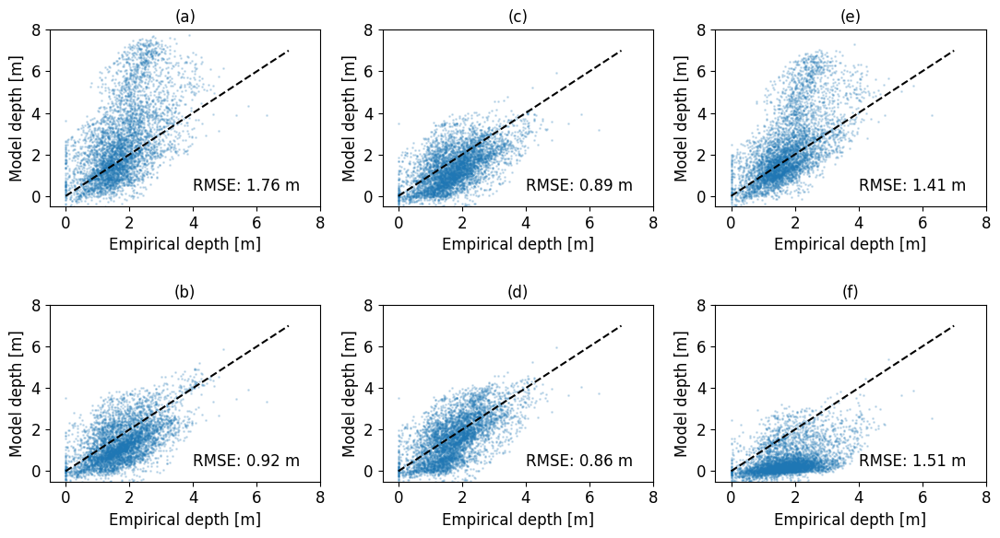

In [50]:
## calculate and print the rmse on the plot
## make all font sizes 12
plt.rc('font', size=12)
plt.rc('axes', titlesize=12)
plt.rc('axes', labelsize=12)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('legend', fontsize=12)
plt.rc('figure', titlesize=12)

tests = ["test1", "test6", "Kh1p0", "test5", "test9", "Kh0p1"]


labels = ['(a)', '(c)', '(e)', '(b)', '(d)', '(f)']
fig,axes = plt.subplots(2, 3, figsize=(11, 6))
axes = axes.flatten()

for ind, test in enumerate(tests):
    ax = axes[ind]

    # find rmse between empirical and test
    rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))

    ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
    ax.plot([0,7],[0,7], color='k', linestyle='--')
    ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
    ax.set_xlim(-0.5,8)
    ax.set_xticks([0,2,4,6,8])
    ax.set_yticks([0,2,4,6,8])
    ax.set_ylim(-0.5,8)
    # if ind in [0,3]:
    #     ax.set_ylabel('Model depth [m]')
    # else:
    #     ax.set_yticklabels([])
    # if ind in [3,4,5]:
    #     ax.set_xlabel('Empirical depth [m]')
    # else:
    #     # remove x tick labels but not the ticks themselves
    #     ax.set_xticklabels([])
    # #     ax.set_xticks([])
    ax.set_xlabel('Empirical depth [m]')
    ax.set_ylabel('Model depth [m]')
    ax.set_title(labels[ind])
plt.tight_layout(h_pad=2)
plt.savefig('figures/wd_emp_scatter_MTL_6.png', dpi=1000, bbox_inches='tight',format='png')
plt.savefig('figures/wd_emp_scatter_MTL_6.pdf', dpi=1000, bbox_inches='tight',format='pdf')
plt.show()

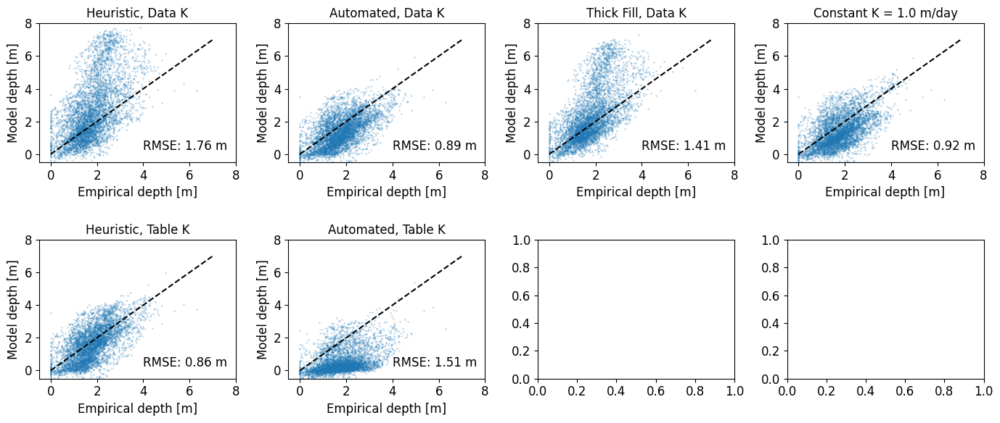

In [51]:

labels = ['Heuristic, Data K', 'Automated, Data K', 'Thick Fill, Data K', 'Constant K = 1.0 m/day', 
          'Heuristic, Table K', 'Automated, Table K', 'Thin Fill, Data K', 'Constant K = 0.1 m/day']

fig,axes = plt.subplots(2, 4, figsize=(14, 6))
axes = axes.flatten()

for ind, test in enumerate(tests):
    ax = axes[ind]

    # find rmse between empirical and test
    rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))

    ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
    ax.plot([0,7],[0,7], color='k', linestyle='--')
    ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
    ax.set_xlim(-0.5,8)
    ax.set_xticks([0,2,4,6,8])
    ax.set_yticks([0,2,4,6,8])
    ax.set_ylim(-0.5,8)
    ax.set_xlabel('Empirical depth [m]')
    ax.set_ylabel('Model depth [m]')
    ax.set_title(labels[ind])
# make there be some vertical space between rows
plt.tight_layout(h_pad=2)
# plt.tight_layout()

C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\148080718.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mov_avg = gdf[gdf[test]>-400].groupby(pd.cut(gdf[gdf[test]>-400]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmean)
C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\148080718.py:17: FutureWarning: The provided callable <function nanmean at 0x0000020AE23B1870> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  mov_avg = gdf[gdf[test]>-400].groupby(pd.cut(gdf[gdf[test]>-400]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmean)
C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\148080718.py:18: FutureWarning: The default of observed=False is deprecated and 

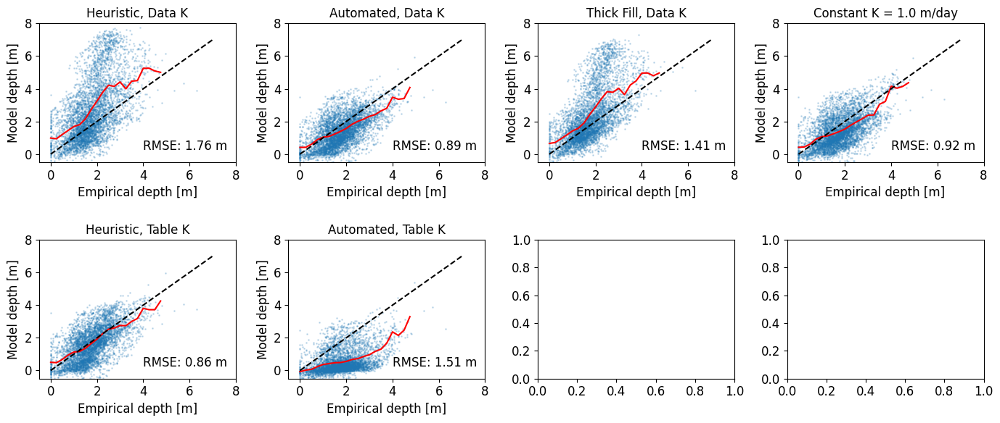

In [52]:
# calculate the moving average of bins of 0.25 m and plot on the above

labels = ['Heuristic, Data K', 'Automated, Data K', 'Thick Fill, Data K', 'Constant K = 1.0 m/day', 
          'Heuristic, Table K', 'Automated, Table K', 'Thin Fill, Data K', 'Constant K = 0.1 m/day']

fig,axes = plt.subplots(2, 4, figsize=(14, 6))
axes = axes.flatten()

for ind, test in enumerate(tests):
    ax = axes[ind]

    # find rmse between empirical and test
    rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))

    ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
    # do not include nan in the mean (use np.nanmean)
    mov_avg = gdf[gdf[test]>-400].groupby(pd.cut(gdf[gdf[test]>-400]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmean)
    mov_med = gdf[gdf[test]>-400].groupby(pd.cut(gdf[gdf[test]>-400]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmedian)

    ax.plot(np.arange(0, 5, 0.25), mov_avg, color='r', lw=1.5)
    # ax.plot(np.arange(0, 5, 0.25), mov_med, color='g', lw=1.5)
    ax.plot([0,7],[0,7], color='k', linestyle='--')
    ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
    ax.set_xlim(-0.5,8)
    ax.set_xticks([0,2,4,6,8])
    ax.set_yticks([0,2,4,6,8])
    ax.set_ylim(-0.5,8)
    ax.set_xlabel('Empirical depth [m]')
    ax.set_ylabel('Model depth [m]')
    ax.set_title(labels[ind])
# make there be some vertical space between rows
plt.tight_layout(h_pad=2)
# plt.tight_layout()

In [53]:
# add a column to gdf placing it inside or outside of fill based on spatial join

shapefile_path = './deposits_shp/sfq2py.shp'
depo = gpd.read_file(shapefile_path)
depo.crs = 'EPSG:4326'
joined = gpd.sjoin(gdf, depo, how='left')
gdf['depo'] = 'Fill'
gdf.loc[joined['PTYPE'] == 'Qds', 'depo'] = 'Dune Sand'

C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\2081022525.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fill_mov_avg = gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')].groupby(pd.cut(gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmean)
C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\2081022525.py:15: FutureWarning: The provided callable <function nanmean at 0x0000020AE23B1870> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  fill_mov_avg = gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')].groupby(pd.cut(gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmean)
C:\Users\Emily

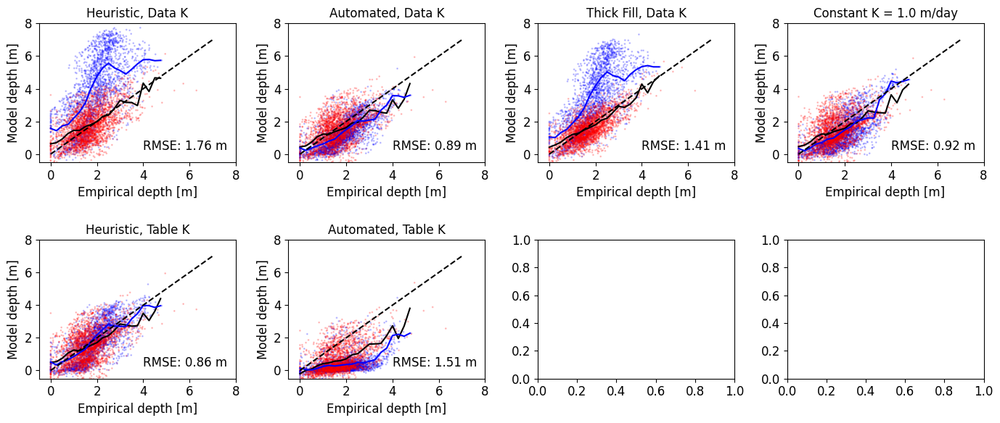

In [54]:

labels = ['Heuristic, Data K', 'Automated, Data K', 'Thick Fill, Data K', 'Constant K = 1.0 m/day', 
          'Heuristic, Table K', 'Automated, Table K', 'Thin Fill, Data K', 'Constant K = 0.1 m/day']

fig,axes = plt.subplots(2, 4, figsize=(14, 6))
axes = axes.flatten()

for ind, test in enumerate(tests):
    ax = axes[ind]

    # find rmse between empirical and test
    rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))
    fill_rmse = np.sqrt(np.mean((gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')]['data'] - gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')][test])**2))
    dune_rmse = np.sqrt(np.mean((gdf[(gdf[test]>-400) & (gdf['depo']=='Dune Sand')]['data'] - gdf[(gdf[test]>-400) & (gdf['depo']=='Dune Sand')][test])**2))

    fill_mov_avg = gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')].groupby(pd.cut(gdf[(gdf[test]>-400) & (gdf['depo']=='Fill')]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmean)
    dune_mov_avg = gdf[(gdf[test]>-400) & (gdf['depo']=='Dune Sand')].groupby(pd.cut(gdf[(gdf[test]>-400) & (gdf['depo']=='Dune Sand')]['data'], np.arange(0, 5.25, 0.25)))[test].agg(np.nanmean)

    ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1, c=gdf[gdf[test]>-400]['depo'].map({'Fill':'r','Dune Sand':'b'}))
    ax.plot(np.arange(0, 5, 0.25), fill_mov_avg, color='k', lw=1.5)
    ax.plot(np.arange(0, 5, 0.25), dune_mov_avg, color='b', lw=1.5)
    ax.plot([0,7],[0,7], color='k', linestyle='--')
    ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)

    ax.set_xlim(-0.5,8)
    ax.set_xticks([0,2,4,6,8])
    ax.set_yticks([0,2,4,6,8])
    ax.set_ylim(-0.5,8)
    ax.set_xlabel('Empirical depth [m]')
    ax.set_ylabel('Model depth [m]')
    ax.set_title(labels[ind])
# make there be some vertical space between rows
plt.tight_layout(h_pad=2)
# plt.tight_layout()

Now I need to make a vertical figure that shows empirical data, differences from empirical on the left and scatter plots on the right

In [55]:
original_prgn = plt.cm.get_cmap('PRGn', 256)
scaled_colors = np.empty((256, 4))
original_positions = np.linspace(-3, 3, 256)  # Original positions from -3 to 3
new_positions = np.linspace(-1, 3, 256)       # New positions from -1 to 3
for i in range(256):
    # Find the closest index in the original positions
    idx = (np.abs(original_positions - new_positions[i])).argmin()
    scaled_colors[i] = original_prgn(idx / 255)

# Create a new LinearSegmentedColormap
new_cmap = mpl.colors.LinearSegmentedColormap.from_list("ScaledPRGn", scaled_colors)



C:\Users\Emily\AppData\Local\Temp\ipykernel_98196\1322392054.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  original_prgn = plt.cm.get_cmap('PRGn', 256)


In [56]:
# can I crop dtw_band and aligned_test_band to the same extent as the gdf
def create_mask_from_band(file_path):
    """Create a mask from a band where data is not NaN."""
    with rasterio.open(file_path) as src:
        band = src.read(1)
        mask = np.isnan(band)  # True where band is NaN
        return ~mask  # Invert mask: True where band is not NaN

def apply_mask_to_band(file_path, mask):
    """Apply a given mask to a raster band, setting unmasked areas to NaN."""
    with rasterio.open(file_path) as src:
        band = src.read(1)
        band[~mask] = np.nan  # Set areas outside the mask to NaN
        return band

# Path to your reference raster file from which the mask will be created
reference_file_path = folder + f'alameda_0_MTL_slr0.00m_Khtest1_10m_wtdepth_nofel.tif'
mask = create_mask_from_band(reference_file_path)

# # Apply this mask to other datasets
# other_file_path1 = "C:\\Users/Emily/Documents/Work/Existing_DTW_reproj.tif"
# other_file_path2 = './gtif_base/Alameda_wt_lmsl_noghb_Kh1p0_slr0p00m.tif'
# emp_band = apply_mask_to_band(other_file_path1, mask)
# homog_band = apply_mask_to_band(other_file_path2, mask)



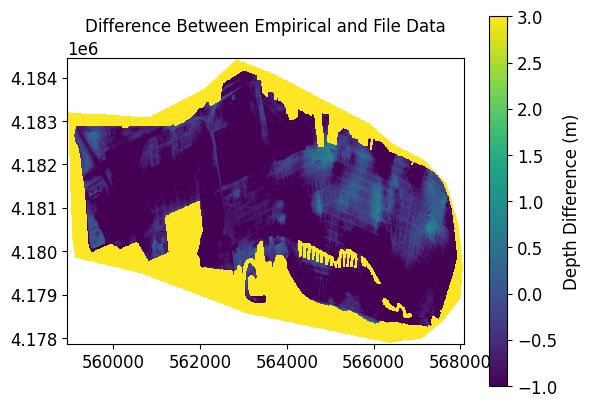

In [57]:
# Define paths
file = folder + f'alameda_0_MTL_slr0.00m_Khtest1_10m_wtdepth_nofel.tif'

# Use the align_rasters function to align empirical data with file data
empirical_band, file_band, aligned_transform = align_rasters(file, newfile)

# Replace no data values with np.nan for processing
empirical_band[empirical_band == -9999] = np.nan
file_band[file_band == -9999] = np.nan

# Calculate the difference between the two datasets
difference = np.where(np.isnan(empirical_band) | np.isnan(file_band), np.nan, empirical_band - file_band)

# Display the result (assuming you have an 'ax' object from matplotlib)
extent = rasterio.plot.plotting_extent(file_band, aligned_transform)
c_lim = 3  # Example color limit value
new_cmap = 'viridis'  # Example colormap

# Plot the difference
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
img = ax.imshow(difference * 0.3048, cmap=new_cmap, extent=extent, vmin=-1, vmax=c_lim)
ax.set_title('Difference Between Empirical and File Data')
plt.colorbar(img, ax=ax, label='Depth Difference (m)')
plt.show()


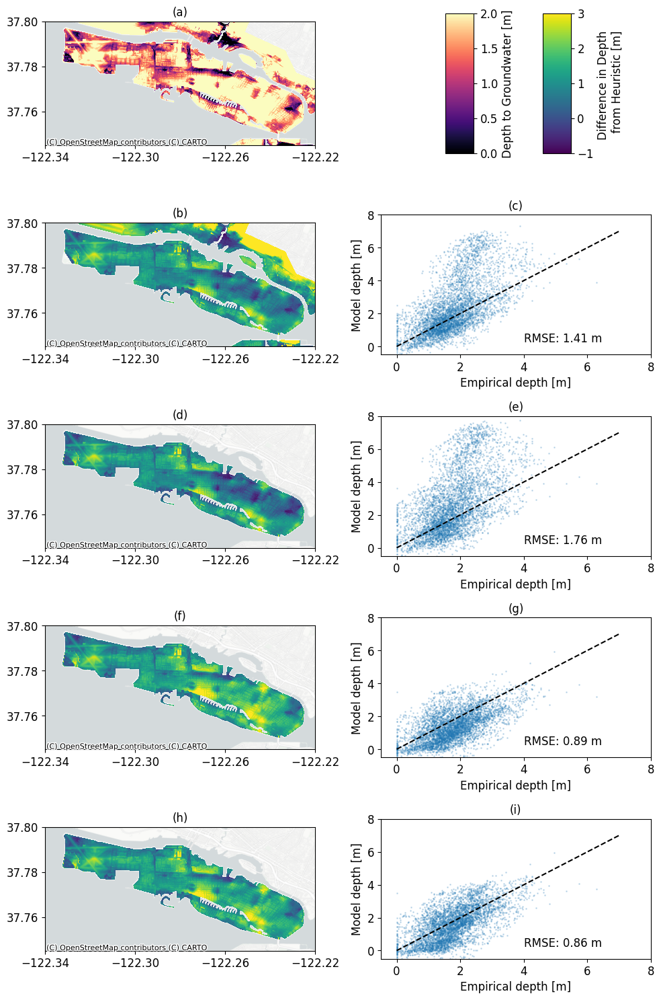

In [58]:
c_lim = 3
newfile = "C:\\Users/Emily/Documents/Work/Existing_DTW_reproj.tif"

fig, axs = plt.subplots(5, 2, figsize=(10, 15))
img = axs[0,0].imshow(dtw_band*0.3048, cmap='magma', extent=rasterio.plot.plotting_extent(dtw_band, transform),vmin=0, vmax=2)
axs[0,0].set_xlim(-122.34, -122.22)
axs[0,0].set_ylim(37.745, 37.8)
axs[0,0].set_xticks(axs[0,0].get_xticks()[::2])
ctx.add_basemap(axs[0,0],source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
axs[0,0].set_title('(a)')

ax =axs[1,0]
file = './gtif_base/Alameda_wt_lmsl_noghb_Kh1p0_slr0p00m.tif'
depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
aligned_test_band[aligned_test_band == -9999] = np.nan
depth_band[depth_band <= -9999] = np.nan
difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band - aligned_test_band)
extent = plotting_extent(aligned_test_band, target_transform)
img = ax.imshow(difference * 0.3048, cmap=new_cmap, extent=extent, vmin=-1, vmax=c_lim)
ax.set_xlim(-122.34, -122.22)
ax.set_ylim(37.745, 37.8)
ax.set_xticks(ax.get_xticks()[::2])
ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
ax.set_title('(b)')

ax = axs[1,1]
test = 'Kh1p0'
rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))
ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
ax.plot([0,7],[0,7], color='k', linestyle='--')
ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
ax.set_xlim(-0.5,8)
ax.set_xticks([0,2,4,6,8])
ax.set_yticks([0,2,4,6,8])
ax.set_ylim(-0.5,8)
ax.set_xlabel('Empirical depth [m]')
ax.set_ylabel('Model depth [m]')
ax.set_title('(c)')


test = 'test1'
file = folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
ax =axs[2,0]
depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
aligned_test_band[aligned_test_band == -9999] = np.nan
depth_band[depth_band <= -9999] = np.nan
difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band - aligned_test_band)
extent = plotting_extent(aligned_test_band, target_transform)
img = ax.imshow(difference * 0.3048, cmap=new_cmap, extent=extent, vmin=-1, vmax=c_lim)
ax.set_xlim(-122.34, -122.22)
ax.set_ylim(37.745, 37.8)
ax.set_xticks(ax.get_xticks()[::2])
ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
ax.set_title('(d)')

ax = axs[2,1]
rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))
ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
ax.plot([0,7],[0,7], color='k', linestyle='--')
ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
ax.set_xlim(-0.5,8)
ax.set_xticks([0,2,4,6,8])
ax.set_yticks([0,2,4,6,8])
ax.set_ylim(-0.5,8)
ax.set_xlabel('Empirical depth [m]')
ax.set_ylabel('Model depth [m]')
ax.set_title('(e)')


test = 'test6'
file = folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
ax=axs[3,0]
depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
aligned_test_band[aligned_test_band == -9999] = np.nan
depth_band[depth_band <= -9999] = np.nan
difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band - aligned_test_band)
extent = plotting_extent(aligned_test_band, target_transform)
img = ax.imshow(difference * 0.3048, cmap=new_cmap, extent=extent, vmin=-1, vmax=c_lim)
ax.set_xlim(-122.34, -122.22)
ax.set_ylim(37.745, 37.8)
ax.set_xticks(ax.get_xticks()[::2])
ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
ax.set_title('(f)')

ax=axs[3,1]
rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))
ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
ax.plot([0,7],[0,7], color='k', linestyle='--')
ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
ax.set_xlim(-0.5,8)
ax.set_xticks([0,2,4,6,8])
ax.set_yticks([0,2,4,6,8])
ax.set_ylim(-0.5,8)
ax.set_xlabel('Empirical depth [m]')
ax.set_ylabel('Model depth [m]')
ax.set_title('(g)')


test = 'test9'
file = folder + f'alameda_0_MTL_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif'
ax=axs[4,0]
depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
aligned_test_band[aligned_test_band == -9999] = np.nan
depth_band[depth_band <= -9999] = np.nan
difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band - aligned_test_band)
extent = plotting_extent(aligned_test_band, target_transform)
img = ax.imshow(difference * 0.3048, cmap=new_cmap, extent=extent, vmin=-1, vmax=c_lim)
ax.set_xlim(-122.34, -122.22)
ax.set_ylim(37.745, 37.8)
ax.set_xticks(ax.get_xticks()[::2])
ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
ax.set_title('(h)')

ax=axs[4,1]
rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))
ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
ax.plot([0,7],[0,7], color='k', linestyle='--')
ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
ax.set_xlim(-0.5,8)
ax.set_xticks([0,2,4,6,8])
ax.set_yticks([0,2,4,6,8])
ax.set_ylim(-0.5,8)
ax.set_xlabel('Empirical depth [m]')
ax.set_ylabel('Model depth [m]')
ax.set_title('(i)')


depth_sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=0, vmax=2))
depth_sm._A = []

# Delta colorbar
delta_sm = plt.cm.ScalarMappable(cmap=new_cmap, norm=plt.Normalize(vmin=-1, vmax=3))
delta_sm._A = []

# Turn off the ghost axis in axs[0, 1]
axs[0, 1].axis('off')

# Adjust the colorbars to be chunkier by changing the 'fraction'
delta_cbar = fig.colorbar(delta_sm, ax=axs[0, 1], orientation='vertical', fraction=0.4, pad=0.2,aspect=5)
delta_cbar.set_label('Difference in Depth \n from Heuristic [m]')

depth_cbar = fig.colorbar(depth_sm, ax=axs[0, 1], orientation='vertical', fraction=0.4, pad=0.02,aspect=5)
depth_cbar.set_label('Depth to Groundwater [m]')


plt.tight_layout()

MemoryError: Unable to allocate 194. MiB for an array with shape (13581, 14951) and data type bool

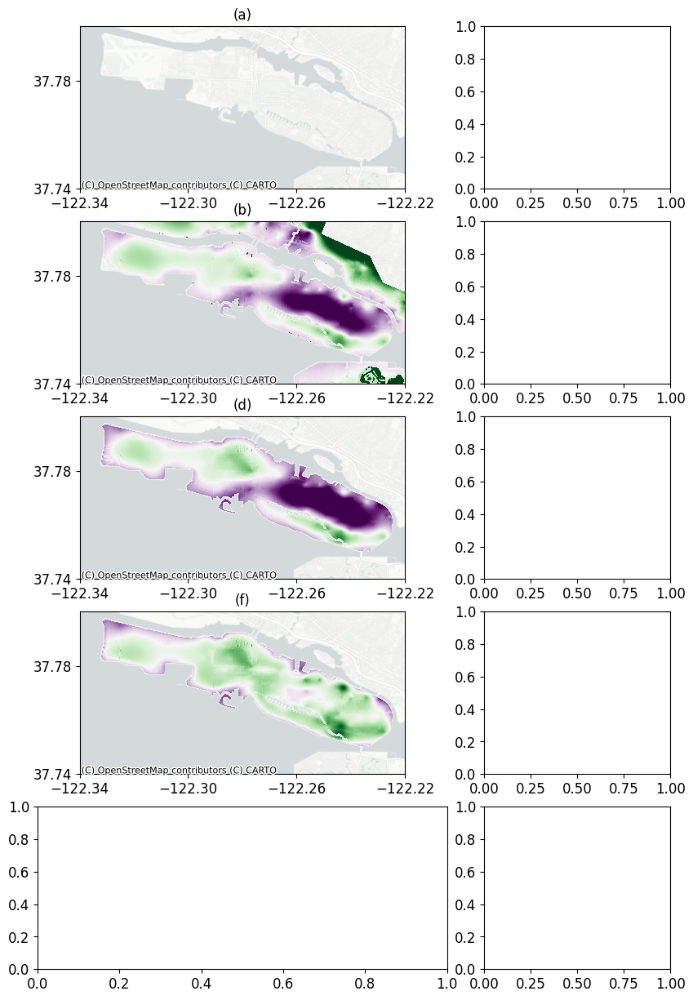

In [62]:
import matplotlib.gridspec as gridspec
shapefile_path = './Alameda_shape.geojson'
file = './Existing_DTW_reproj.tif'
with fiona.open(shapefile_path) as shapefile:
    # Get the first feature (assuming it's a single polygon)
    feature = next(iter(shapefile))
    geometry = shape(feature['geometry'])
    # Get the bounds of the geometry
    minx, miny, maxx, maxy = geometry.bounds
    # Create a mask for the raster data
    mask = rasterio.features.geometry_mask([geometry], transform=transform, invert=True, out_shape=(height, width))

fig = plt.figure(figsize=(10, 15))
gs = gridspec.GridSpec(5, 3, figure=fig)

# Create subplots
# The left column spans the first two of the three virtual columns
axs = [fig.add_subplot(gs[i, :2]) for i in range(5)]
axs_right = [fig.add_subplot(gs[i, 2]) for i in range(5)]

lhs_titles = ['(d)', '(f)', '(h)']
tests = ["test1", "test6", "test9"]
for i, ax in enumerate(axs):
    if i == 0:
        dtw_band = np.where(mask, dtw_band, np.nan)
        img = ax.imshow(dtw_band*0.3048, cmap='magma', extent=rasterio.plot.plotting_extent(dtw_band, transform),vmin=0, vmax=2)
        ax.set_xlim(-122.34, -122.22)
        ax.set_ylim(37.745, 37.8)
        ax.set_xticks(ax.get_xticks()[::2])
        ax.set_yticks(ax.get_yticks()[::2])
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
        ax.set_title('(a)')
    elif i == 1:
        file = './gtif_base/Alameda_wt_lmsl_noghb_Kh1p0_slr0p00m.tif'
        depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
        aligned_test_band[aligned_test_band == -9999] = np.nan
        depth_band[depth_band <= -9999] = np.nan
        difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band * 0.3048 - aligned_test_band)
        difference = difference.astype(np.float16)
        extent = plotting_extent(aligned_test_band, target_transform)
        img = ax.imshow(difference, cmap='PRGn', extent=extent, vmin=-c_lim, vmax=c_lim)
        ax.set_xlim(-122.34, -122.22)
        ax.set_ylim(37.745, 37.8)
        ax.set_xticks(ax.get_xticks()[::2])
        ax.set_yticks(ax.get_yticks()[::2])
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
        ax.set_title('(b)')
    else: 
        file = folder + f'alameda_0_MTL_slr0.00m_Kh{tests[i-2]}_10m_wtdepth_nofel.tif'
        depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
        aligned_test_band[aligned_test_band == -9999] = np.nan
        depth_band[depth_band <= -9999] = np.nan
        difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band*0.3048 - aligned_test_band)
        extent = plotting_extent(aligned_test_band, target_transform)
        img = ax.imshow(difference, cmap='PRGn', extent=extent, vmin=-c_lim, vmax=c_lim)
        ax.set_xlim(-122.34, -122.22)
        ax.set_ylim(37.745, 37.8)
        ax.set_xticks(ax.get_xticks()[::2])
        ax.set_yticks(ax.get_yticks()[::2])
        ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)
        ax.set_title(lhs_titles[i-2])

rhs_titles = ['(c)', '(e)', '(g)', '(i)']
tests = ["Kh1p0","test1", "test6", "test9"]

for i , ax in enumerate(axs_right):
    if i == 0:
        depth_sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=0, vmax=2))
        depth_sm._A = []

        # Delta colorbar
        delta_sm = plt.cm.ScalarMappable(cmap='PRGn', norm=plt.Normalize(vmin=-c_lim, vmax=c_lim))
        delta_sm._A = []

        # Turn off the ghost axis in axs[0, 1]
        ax.axis('off')

        # Adjust the colorbars to be chunkier by changing the 'fraction'
        delta_cbar = fig.colorbar(delta_sm, ax=ax, orientation='vertical', fraction=0.4, pad=0.02,aspect=5)
        delta_cbar.set_label('Difference in Depth \n from Empirical [m]')

        depth_cbar = fig.colorbar(depth_sm, ax=ax, orientation='vertical', fraction=0.8, pad=0.02,aspect=5)
        depth_cbar.set_label('Depth to \nGroundwater [m]')

    else:
        test = tests[i-1]
        rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))
        ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=1)
        ax.plot([0,7],[0,7], color='k', linestyle='--')
        ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
        ax.set_xlim(-0.5,8)
        ax.set_xticks([0,2,4,6,8])
        ax.set_yticks([0,2,4,6,8])
        ax.set_ylim(-0.5,8)
        ax.set_xlabel('Empirical depth [m]')
        ax.set_ylabel('Model depth [m]')
        ax.set_title(rhs_titles[i-1])
    
plt.tight_layout()
# plt.savefig('figures/empirical_comparison.png', dpi=1000, bbox_inches='tight',format='png')
# plt.savefig('figures/empirical_comparison.pdf', dpi=1000, bbox_inches='tight',format='pdf')
plt.show()


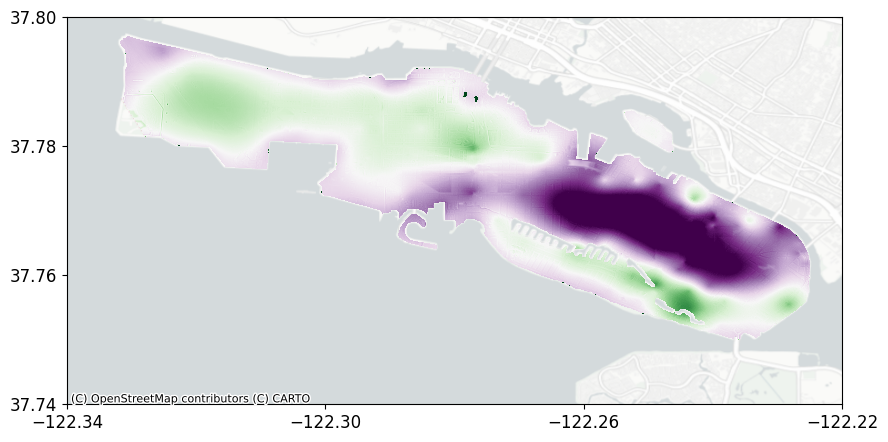

In [67]:
# make a single plot like this and crop the band with the shapefile

axs = plt.subplots(1, 1, figsize=(10, 10))
ax = axs[1]
shapefile_path = './Alameda_shape.geojson'
with fiona.open(shapefile_path) as shapefile:
    # Get the first feature (assuming it's a single polygon)
    feature = next(iter(shapefile))
    geometry = shape(feature['geometry'])
    # Get the bounds of the geometry
    minx, miny, maxx, maxy = geometry.bounds
    # Create a mask for the raster data
    mask = rasterio.features.geometry_mask([geometry], transform=transform, invert=True, out_shape=(height, width))

file = './gtif_base/Alameda_wt_lmsl_noghb_Kh1p0_slr0p00m.tif'
depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
aligned_test_band[aligned_test_band == -9999] = np.nan
depth_band[depth_band <= -9999] = np.nan
depth_band = np.where(mask, depth_band, np.nan)
difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band * 0.3048 - aligned_test_band)
difference = difference.astype(np.float16)
extent = plotting_extent(aligned_test_band, target_transform)
img = ax.imshow(difference, cmap='PRGn', extent=extent, vmin=-c_lim, vmax=c_lim)
ax.set_xlim(-122.34, -122.22)
ax.set_ylim(37.745, 37.8)
ax.set_xticks(ax.get_xticks()[::2])
ax.set_yticks(ax.get_yticks()[::2])
ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)

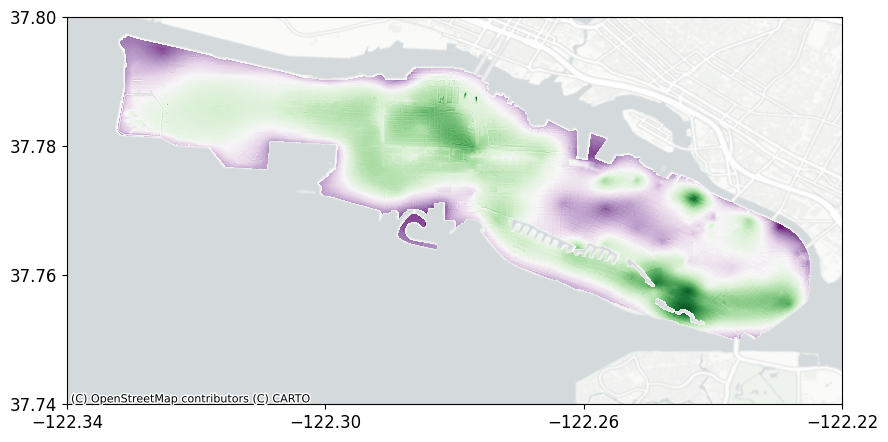

In [75]:
axs = plt.subplots(1, 1, figsize=(10, 10))
ax = axs[1]
file = folder + f'alameda_0_MTL_slr0.00m_Khtest9_10m_wtdepth_nofel.tif'
depth_band, aligned_test_band, target_transform = align_rasters(newfile, file)
aligned_test_band[aligned_test_band == -9999] = np.nan
depth_band[depth_band <= -9999] = np.nan
depth_band = np.where(mask, depth_band, np.nan)
difference = np.where(np.isnan(depth_band) | np.isnan(aligned_test_band),np.nan,depth_band * 0.3048 - aligned_test_band)
difference = difference.astype(np.float16)
extent = plotting_extent(aligned_test_band, target_transform)
img = ax.imshow(difference, cmap='PRGn', extent=extent, vmin=-c_lim, vmax=c_lim)
ax.set_xlim(-122.34, -122.22)
ax.set_ylim(37.745, 37.8)
ax.set_xticks(ax.get_xticks()[::2])
ax.set_yticks(ax.get_yticks()[::2])
ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels,crs='EPSG:4326',zorder=-1)

Text(0, 0.5, 'Model depth [m]')

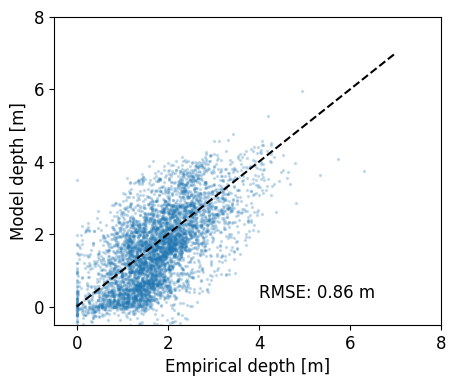

In [73]:
# now plot just the scatterplot for the Kh1p0
fig, ax = plt.subplots(figsize=(5, 4))
test = 'test9'
rmse = np.sqrt(np.mean((gdf[gdf[test]>-400]['data'] - gdf[gdf[test]>-400][test])**2))
ax.scatter(gdf[gdf[test]>-400]['data'], gdf[gdf[test]>-400][test], alpha=0.2, s=2)
ax.plot([0,7],[0,7], color='k', linestyle='--')
ax.text(4, 0.25, f'RMSE: {rmse:.2f} m', fontsize=12)
ax.set_xlim(-0.5,8)
ax.set_xticks([0,2,4,6,8])
ax.set_yticks([0,2,4,6,8])
ax.set_ylim(-0.5,8)
ax.set_xlabel('Empirical depth [m]')
ax.set_ylabel('Model depth [m]')


#### Testing water depth versus fill depth

test1
test2
test3
test4
test5
test6
test7
test8
test9


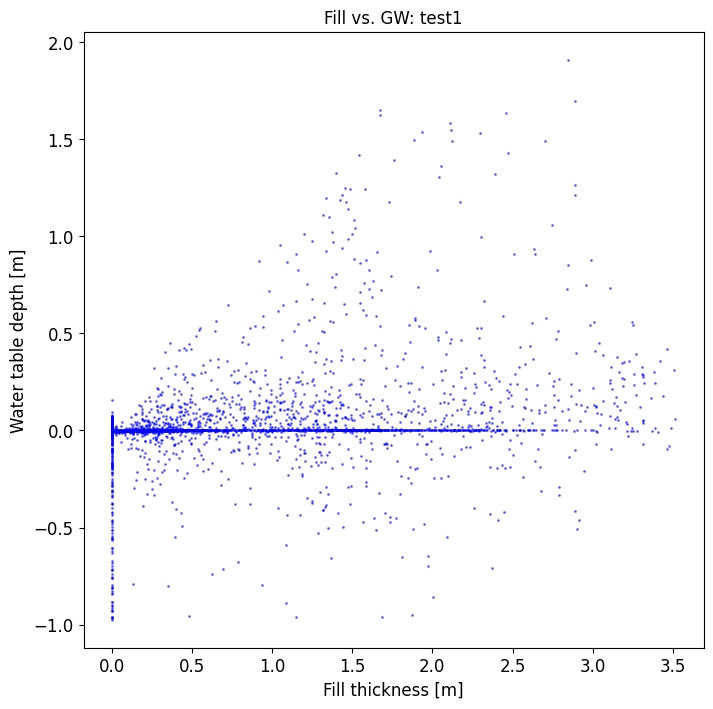

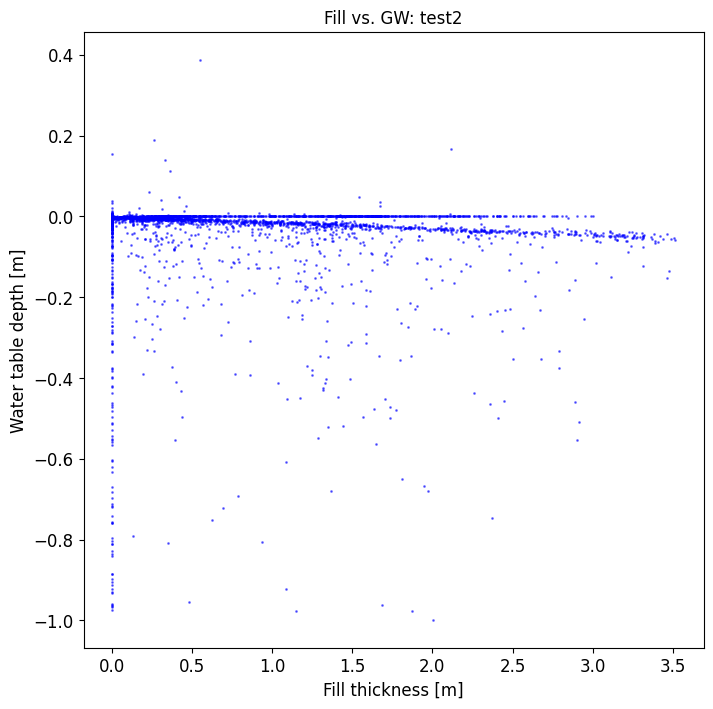

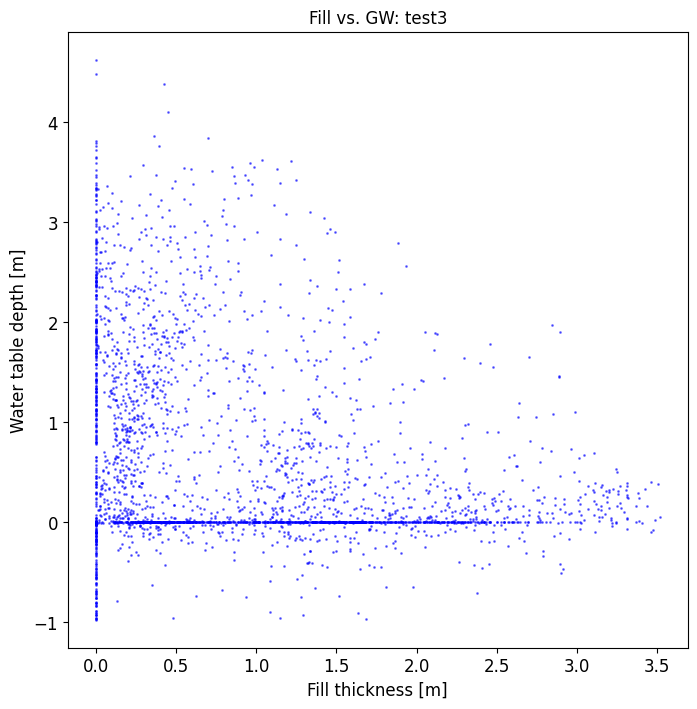

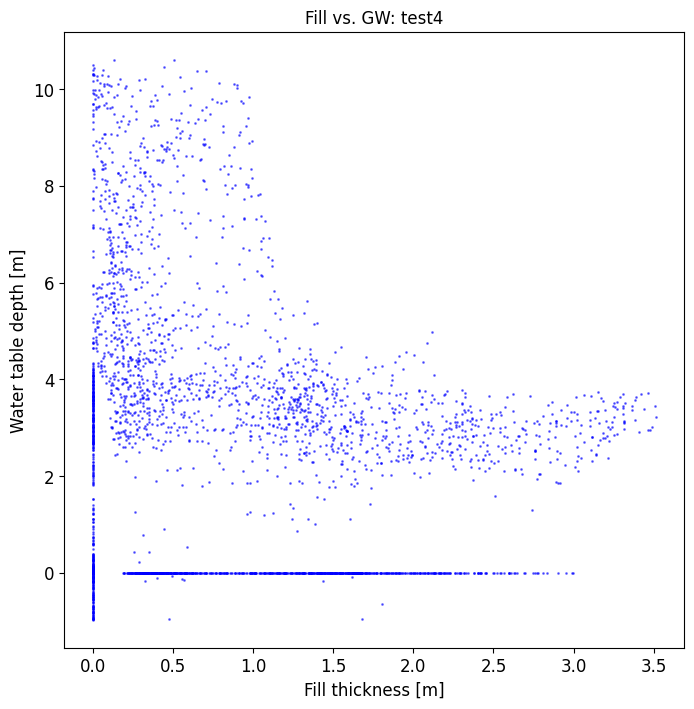

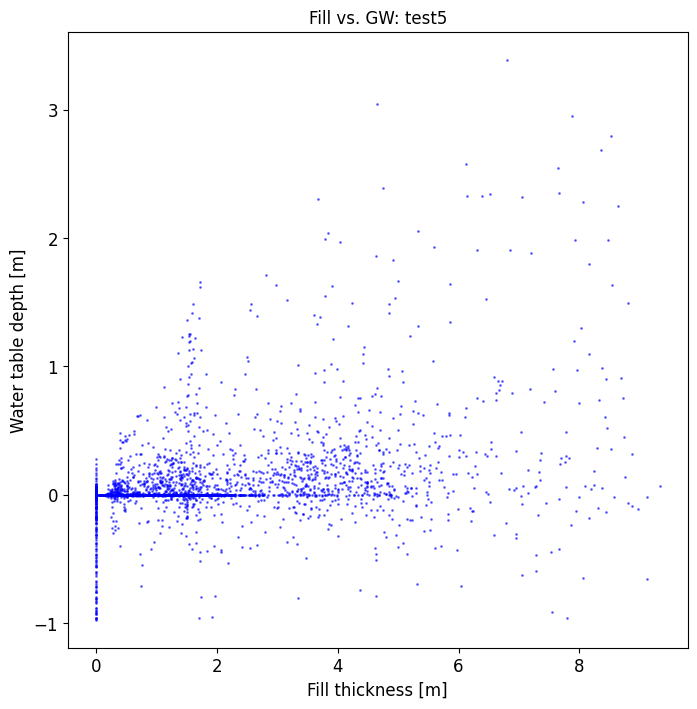

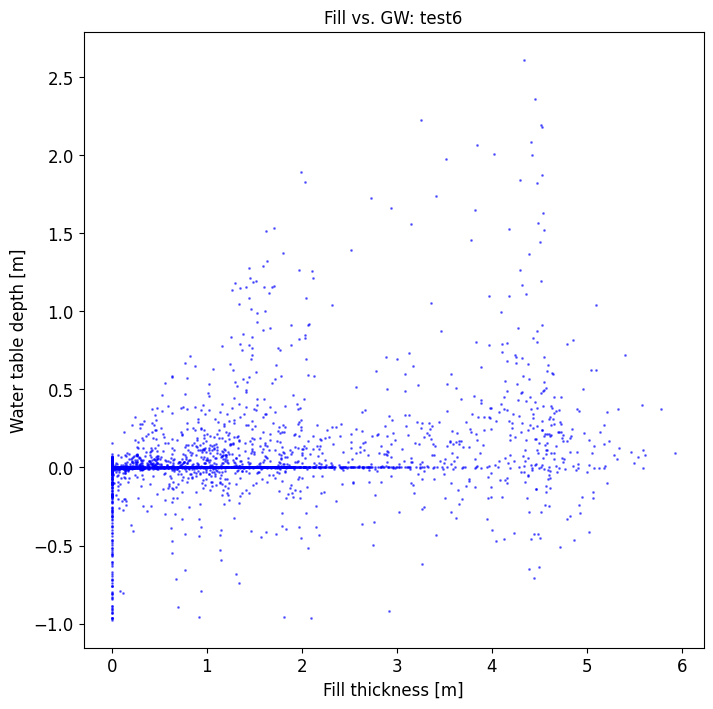

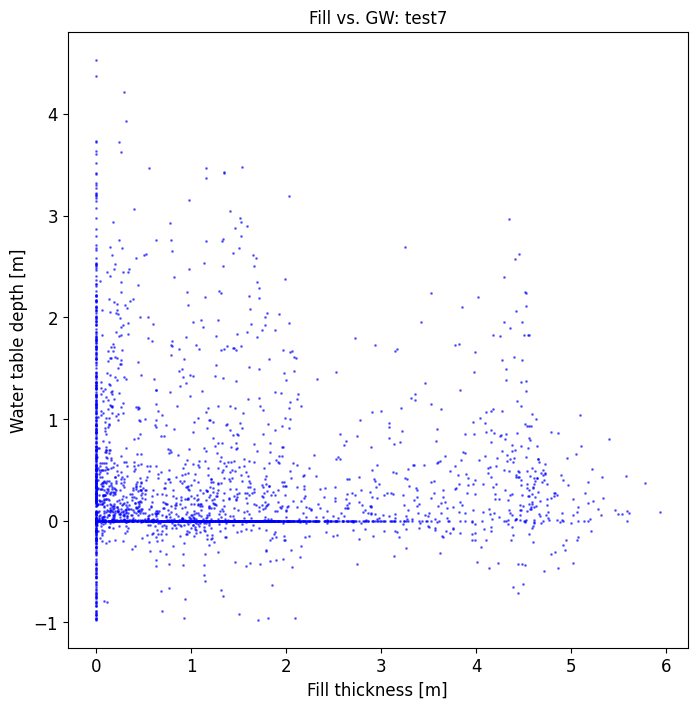

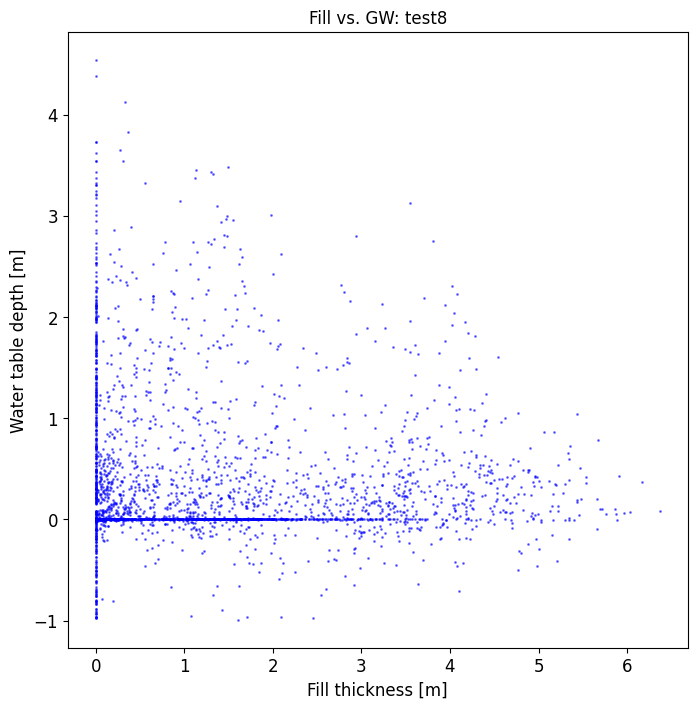

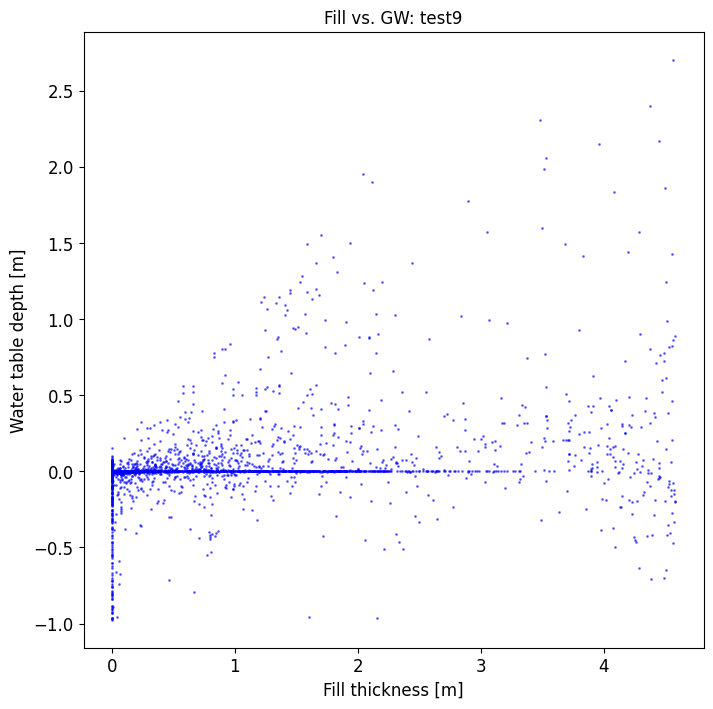

In [ ]:
for test in inputs['names']:
    print(test)
    fill_path = f"./out_geotiffs/layer0_thick_m_{test}.tif"
    gw_path   = f"./wtdepths/alameda_0_MHHW_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif"

    # 1) Open the FILL raster (master)
    with rasterio.open(fill_path) as src_fill:
        fill_arr = src_fill.read(1).astype("float32")
        fill_meta = src_fill.meta.copy()
        # We'll grab the shape, transform, CRS, etc. from fill
        fill_transform = src_fill.transform
        fill_crs = src_fill.crs
        fill_height, fill_width = fill_arr.shape

    # 2) Open the GW raster
    with rasterio.open(gw_path) as src_gw:
        gw_arr_original = src_gw.read(1).astype("float32")

        # Prepare an empty array with the SAME shape as fill
        gw_arr_resampled = np.empty((fill_height, fill_width), dtype="float32")

        # Construct new metadata for GW that matches fill’s grid
        gw_meta = src_gw.meta.copy()
        gw_meta.update({
            "crs": fill_crs,
            "transform": fill_transform,
            "width": fill_width,
            "height": fill_height
        })

        # 3) Reproject the GW raster onto the fill raster’s grid
        reproject(
            source=gw_arr_original,
            destination=gw_arr_resampled,
            src_transform=src_gw.transform,
            src_crs=src_gw.crs,
            dst_transform=fill_transform,
            dst_crs=fill_crs,
            resampling=Resampling.nearest
        )

    # At this point, fill_arr.shape == gw_arr_resampled.shape
    # 4) Mask out invalid data, flatten, and do scatter
    fill_arr = np.where(fill_arr < -1, np.nan, fill_arr)
    gw_arr_resampled = np.where(gw_arr_resampled < -1, np.nan, gw_arr_resampled)

    fill_flat = fill_arr.ravel()
    gw_flat   = gw_arr_resampled.ravel()

    mask_valid = ~np.isnan(fill_flat) & ~np.isnan(gw_flat)
    fill_valid = fill_flat[mask_valid]
    gw_valid   = gw_flat[mask_valid]

    # Now fill_valid and gw_valid have the same length
    # 5) Scatter plot
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(fill_valid, gw_valid, s=1, color="blue", alpha=0.5)
    ax.set_xlabel("Fill thickness [m]")
    ax.set_ylabel("Water table depth [m]")
    ax.set_title(f"Fill vs. GW: {test}")
    # plt.show()


Processing test: test1
Processing test: test2
Processing test: test3
Processing test: test4
Processing test: test5
Processing test: test6
Processing test: test7
Processing test: test8
Processing test: test9


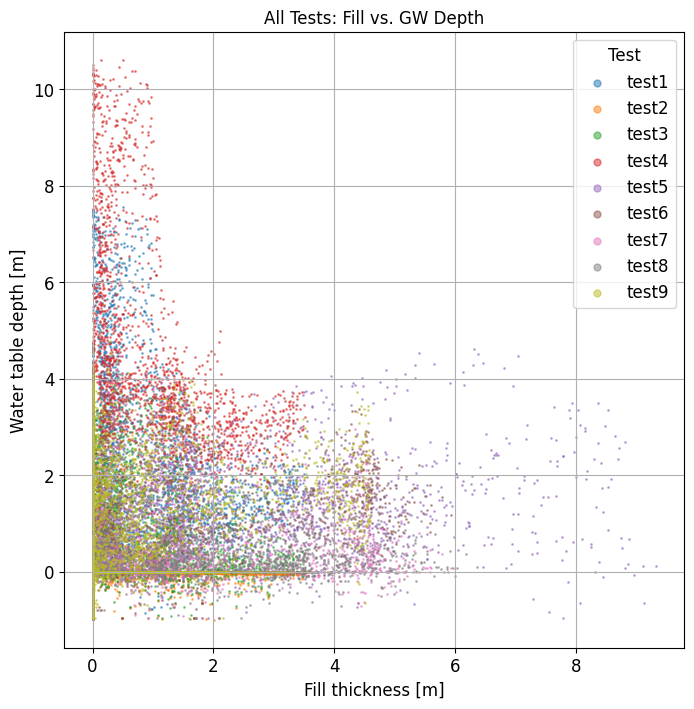

In [ ]:
# Two dictionaries to collect (x,y) data for each test
fill_valid_dict = {}
gw_valid_dict = {}

for test in inputs['names']:
    print(f"Processing test: {test}")
    
    fill_path = f"./out_geotiffs/layer0_thick_m_{test}.tif"
    gw_path   = f"./wtdepths_250130/alameda_0_MHHW_slr0.00m_Kh{test}_10m_wtdepth_nofel.tif"
    
    # 1) Open the fill raster (master)
    with rasterio.open(fill_path) as src_fill:
        fill_arr = src_fill.read(1).astype("float32")
        fill_meta = src_fill.meta.copy()
        
        fill_transform = src_fill.transform
        fill_crs = src_fill.crs
        fill_height, fill_width = fill_arr.shape
    
    # 2) Open and reproject the GW raster to match the fill raster
    with rasterio.open(gw_path) as src_gw:
        gw_arr_original = src_gw.read(1).astype("float32")
        
        # Prepare an empty array with the SAME shape as fill
        gw_arr_resampled = np.empty((fill_height, fill_width), dtype="float32")
        
        # Reproject parameters (forcing GW to match fill's grid)
        reproject(
            source=gw_arr_original,
            destination=gw_arr_resampled,
            src_transform=src_gw.transform,
            src_crs=src_gw.crs,
            dst_transform=fill_transform,
            dst_crs=fill_crs,
            resampling=Resampling.nearest
        )
    
    # 3) Mask out invalid data (example threshold: < -1 => NaN)
    fill_arr = np.where(fill_arr < -1, np.nan, fill_arr)
    gw_arr_resampled = np.where(gw_arr_resampled < -1, np.nan, gw_arr_resampled)
    
    # 4) Flatten and filter out NaNs
    fill_flat = fill_arr.ravel()
    gw_flat   = gw_arr_resampled.ravel()
    
    mask_valid = ~np.isnan(fill_flat) & ~np.isnan(gw_flat)
    fill_valid = fill_flat[mask_valid]
    gw_valid   = gw_flat[mask_valid]
    
    # 5) Store in dictionaries
    fill_valid_dict[test] = fill_valid
    gw_valid_dict[test]   = gw_valid

# --------------------------------------------------------------------
# ONE SCATTERPLOT FOR ALL TESTS (each test a different default color)
# --------------------------------------------------------------------
plt.figure(figsize=(8, 8))
scatter_handles = []
for test in inputs['names']:
    x = fill_valid_dict[test]
    y = gw_valid_dict[test]
    scatter = plt.scatter(x, y, s=1, alpha=0.5, label=test)
    scatter_handles.append(scatter)
plt.xlabel("Fill thickness [m]")
plt.ylabel("Water table depth [m]")
plt.title("All Tests: Fill vs. GW Depth")
plt.legend(handles = scatter_handles,title="Test", markerscale=5,handler_map={plt.scatter: mpl.legend_handler.HandlerPathCollection(update_func=lambda h, a: h.set_alpha(1))})
# make the legend markers alpha=1
plt.grid(True)
plt.show()
